## Assignment 3: Generative Model

# Part I - Generative Adversarial Networks (GANs)
So far in DS6050, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__.
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

2023-10-18 20:11:04.852979: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-10-18 20:11:04.914194: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-10-18 20:11:05.204390: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-18 20:11:05.204443: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-18 20:11:05.206029: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to regi

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy.


**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1].

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data

        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B))

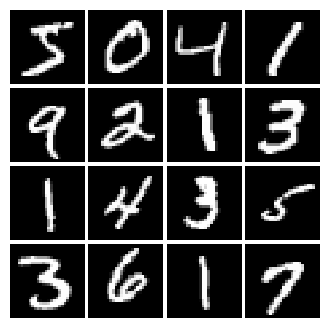

In [3]:
# show a batch
mnist = MNIST(batch_size=16)
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.

    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU

    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha * x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.

    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate

    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform(shape=(batch_size, dim), minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")

test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1

The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        # Fully connected layer with input size 784 and output size 256
        tf.keras.layers.Dense(256, input_shape=(784,)),
        
        # LeakyReLU with alpha 0.01
        tf.keras.layers.LeakyReLU(0.01),

        # Fully connected layer with output size 256
        tf.keras.layers.Dense(256),
        
        # LeakyReLU with alpha 0.01
        tf.keras.layers.LeakyReLU(0.01),

        # Fully connected layer with output size 1
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')

test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with input size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # Fully connected layer with input size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),
        
        # ReLU
        tf.keras.layers.ReLU(),

        # Fully connected layer with output size 1024
        tf.keras.layers.Dense(1024),

        # ReLU
        tf.keras.layers.ReLU(),

        # Fully connected layer with output size 784
        tf.keras.layers.Dense(784),
        
        # TanH (To restrict every element of the output to be in the range [-1,1])
        tf.keras.layers.Activation('tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')

test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.

    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(logits_real), logits_real)
    fake_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z).

In [16]:
# TODO: create an AdamOptimizer for D_optimizer and G_optimizer
def get_optimizers(learning_rate=1e-3, beta1=0.5):
    """Create optimizer for GAN training.

    Inputs:
    - learning_rate: learning rate to use for both optimizer
    - beta1: beta1 parameter for both optimizer (first moment decay)

    Returns:
    - D_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_optimizer = None
    G_optimizer = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    D_optimizer = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_optimizer = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_optimizer, G_optimizer

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other.

In [17]:
# a giant helper function
def run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_optimizer: an Optimizer for Discriminator
    - G_optimizer: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)

    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)
                D_optimizer.apply_gradients(zip(d_gradients, D.trainable_variables))

            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)
                G_optimizer.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1

    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.246, G:0.7113
Instructions for updating:
Use tf.identity with explicit device placement instead.


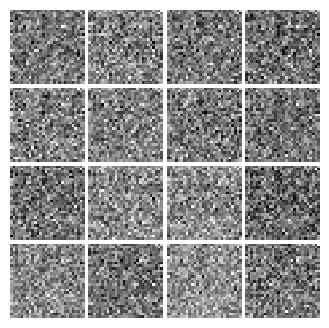

Epoch: 0, Iter: 20, D: 0.6086, G:0.8625


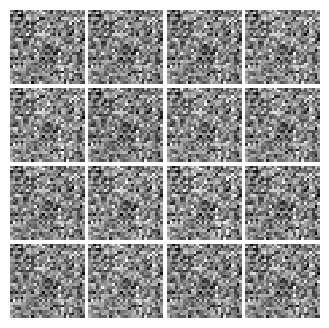

Epoch: 0, Iter: 40, D: 0.4719, G:1.071


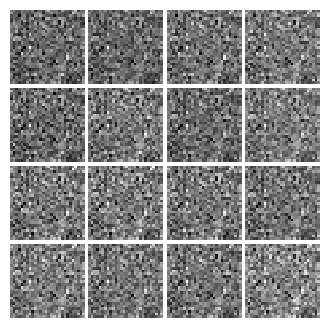

Epoch: 0, Iter: 60, D: 0.1848, G:2.156


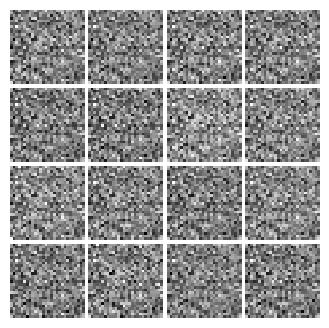

Epoch: 0, Iter: 80, D: 3.085, G:0.8467


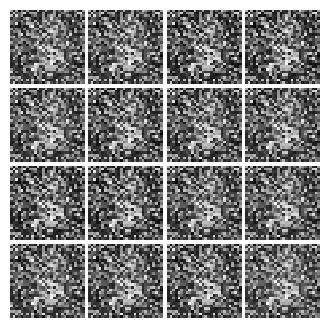

Epoch: 0, Iter: 100, D: 0.7063, G:1.623


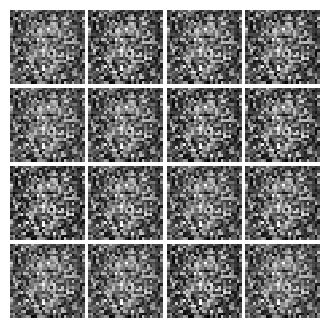

Epoch: 0, Iter: 120, D: 0.9622, G:1.619


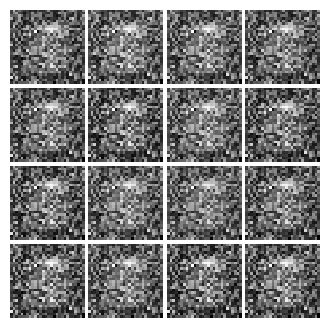

Epoch: 0, Iter: 140, D: 1.608, G:1.379


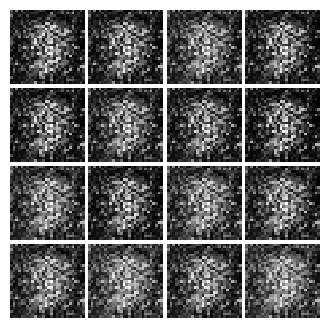

Epoch: 0, Iter: 160, D: 1.857, G:0.5271


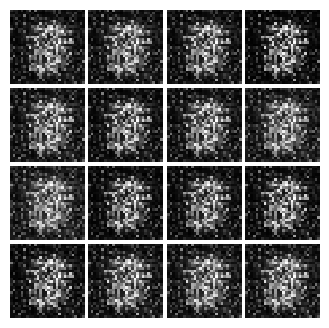

Epoch: 0, Iter: 180, D: 1.813, G:0.8052


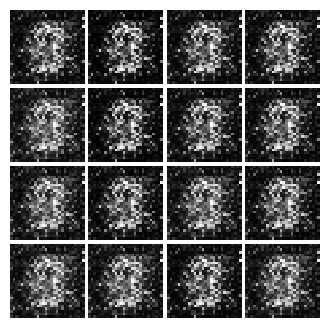

Epoch: 0, Iter: 200, D: 1.118, G:1.562


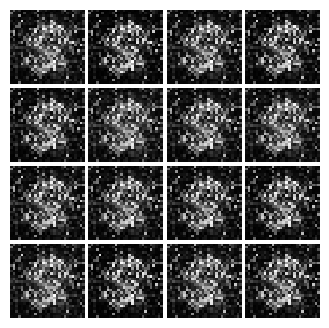

Epoch: 0, Iter: 220, D: 1.862, G:0.8904


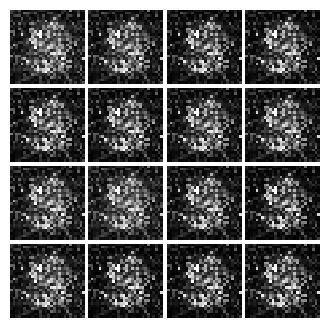

Epoch: 0, Iter: 240, D: 1.16, G:1.615


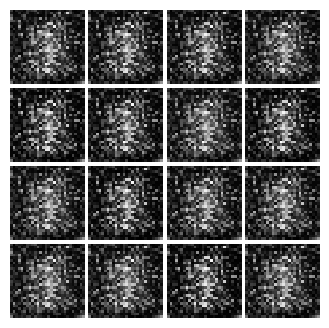

Epoch: 0, Iter: 260, D: 0.9828, G:1.16


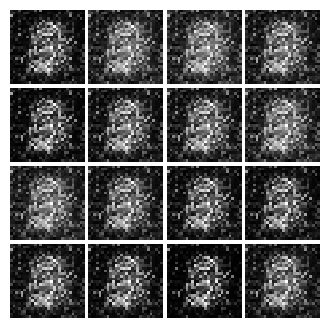

Epoch: 0, Iter: 280, D: 0.9807, G:1.371


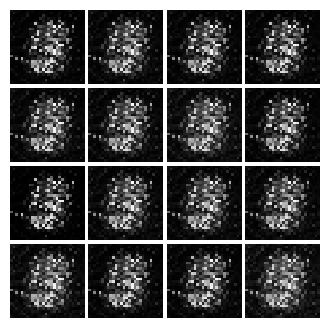

Epoch: 0, Iter: 300, D: 1.088, G:1.103


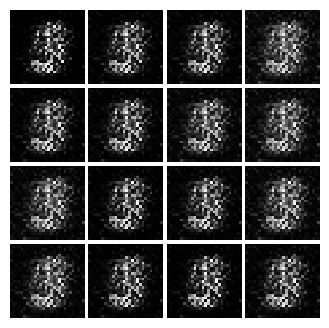

Epoch: 0, Iter: 320, D: 1.067, G:1.158


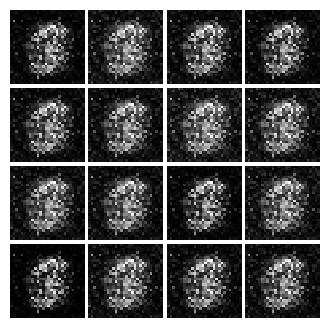

Epoch: 0, Iter: 340, D: 1.479, G:2.283


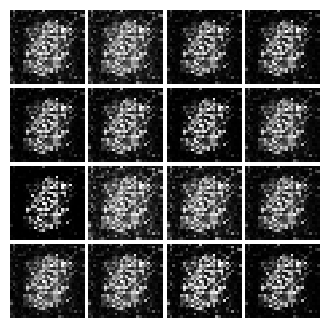

Epoch: 0, Iter: 360, D: 1.815, G:0.9867


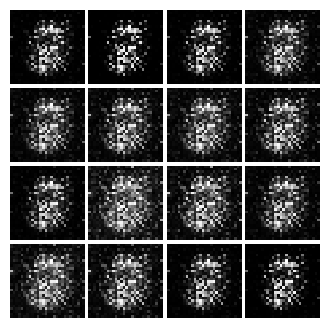

Epoch: 0, Iter: 380, D: 1.196, G:0.9429


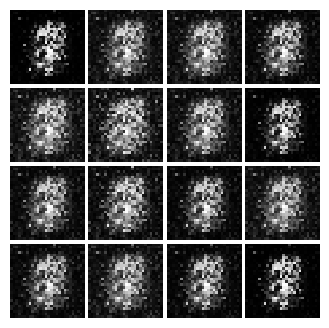

Epoch: 0, Iter: 400, D: 1.424, G:1.095


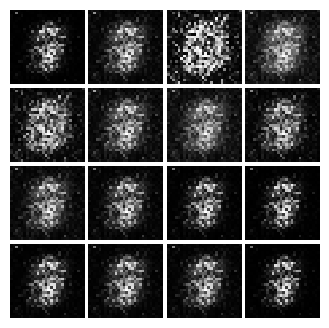

Epoch: 0, Iter: 420, D: 1.423, G:0.8844


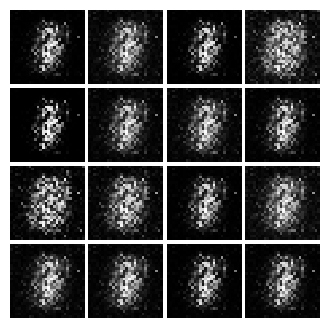

Epoch: 0, Iter: 440, D: 1.281, G:1.144


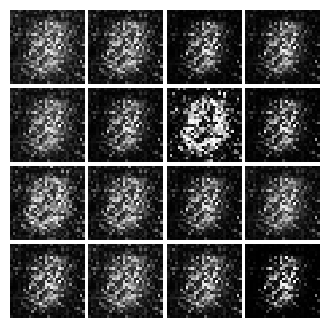

Epoch: 0, Iter: 460, D: 1.24, G:1.352


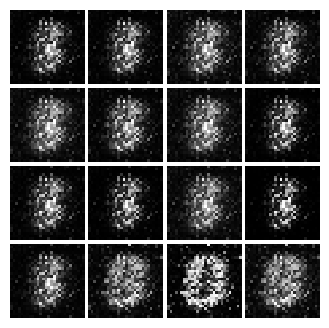

Epoch: 1, Iter: 480, D: 1.452, G:0.9991


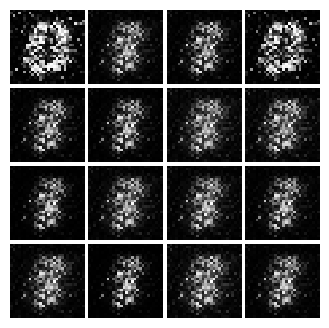

Epoch: 1, Iter: 500, D: 1.724, G:0.7296


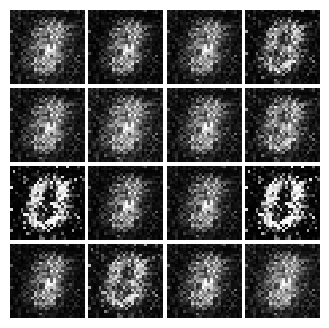

Epoch: 1, Iter: 520, D: 1.501, G:1.52


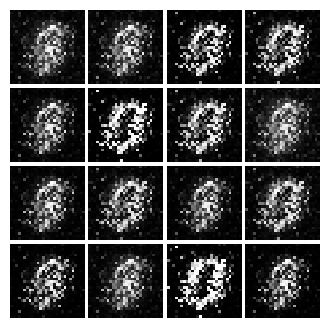

Epoch: 1, Iter: 540, D: 1.233, G:1.183


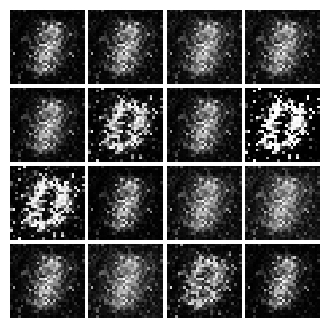

Epoch: 1, Iter: 560, D: 1.118, G:1.618


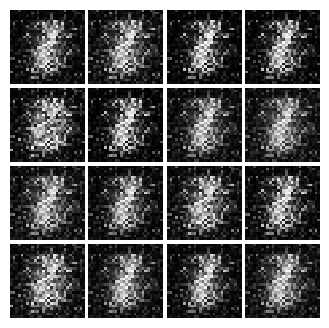

Epoch: 1, Iter: 580, D: 1.682, G:0.8696


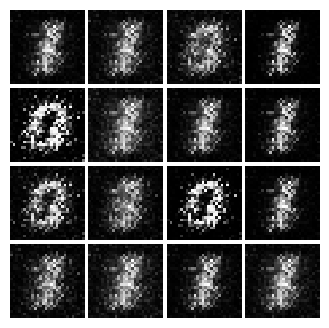

Epoch: 1, Iter: 600, D: 1.077, G:1.286


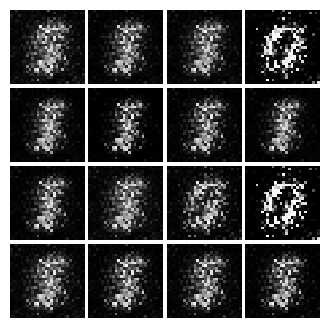

Epoch: 1, Iter: 620, D: 0.9969, G:1.277


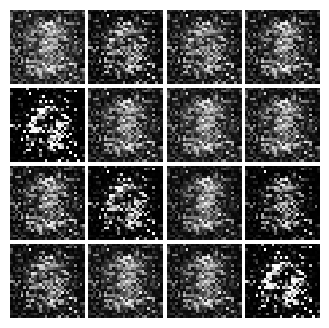

Epoch: 1, Iter: 640, D: 2.011, G:1.74


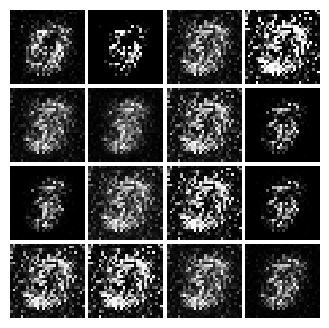

Epoch: 1, Iter: 660, D: 1.226, G:1.246


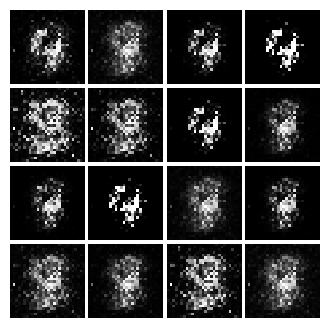

Epoch: 1, Iter: 680, D: 1.098, G:1.119


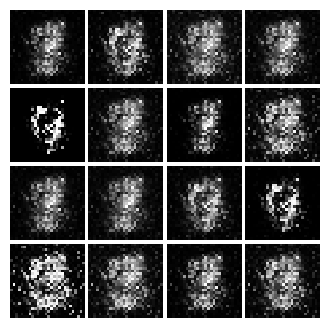

Epoch: 1, Iter: 700, D: 1.151, G:1.036


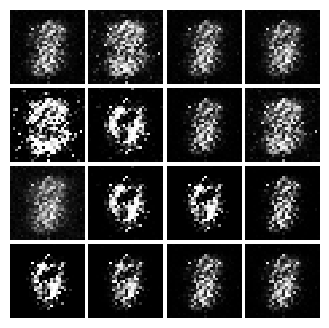

Epoch: 1, Iter: 720, D: 1.475, G:0.9976


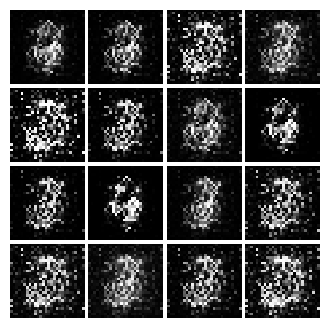

Epoch: 1, Iter: 740, D: 1.142, G:1.403


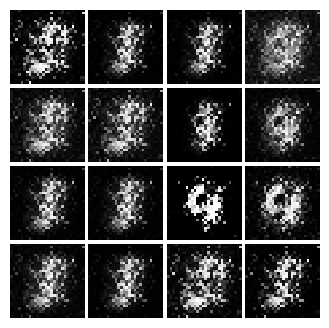

Epoch: 1, Iter: 760, D: 1.231, G:1.917


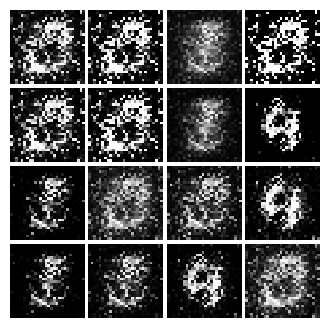

Epoch: 1, Iter: 780, D: 1.435, G:1.469


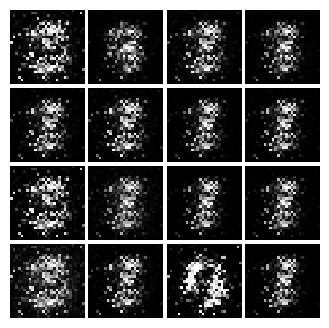

Epoch: 1, Iter: 800, D: 1.358, G:0.7969


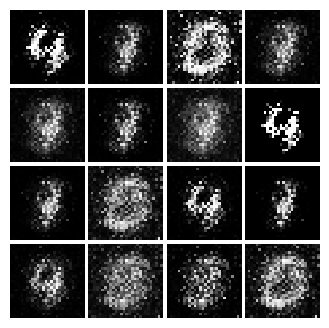

Epoch: 1, Iter: 820, D: 1.417, G:0.8321


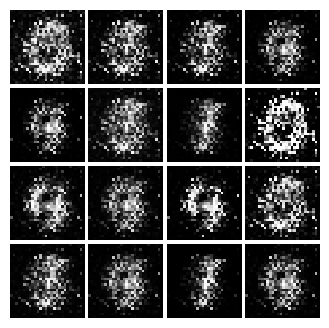

Epoch: 1, Iter: 840, D: 1.044, G:1.207


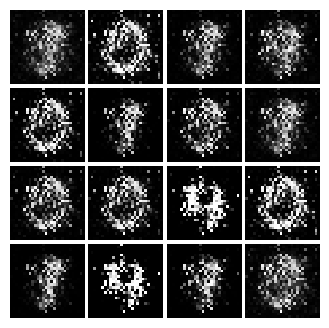

Epoch: 1, Iter: 860, D: 0.82, G:1.618


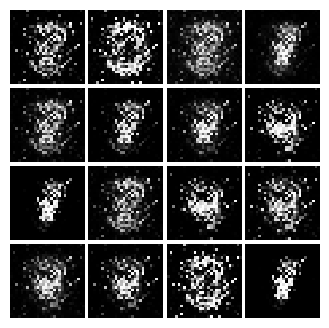

Epoch: 1, Iter: 880, D: 1.192, G:0.7217


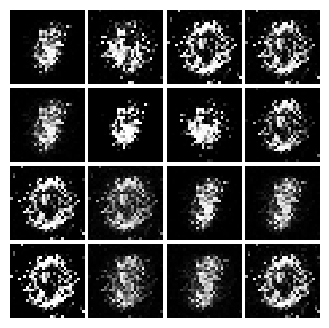

Epoch: 1, Iter: 900, D: 1.322, G:1.684


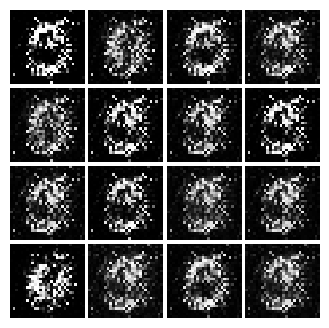

Epoch: 1, Iter: 920, D: 0.889, G:2.518


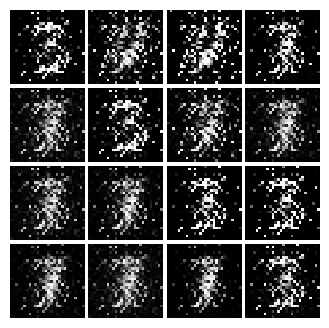

Epoch: 2, Iter: 940, D: 1.24, G:1.846


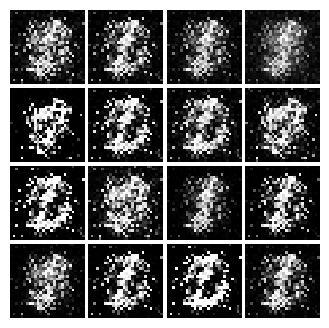

Epoch: 2, Iter: 960, D: 1.087, G:1.454


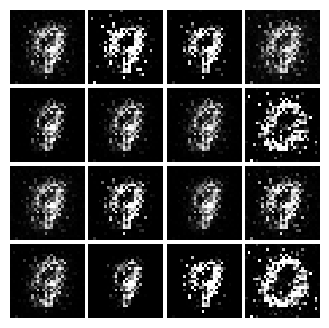

Epoch: 2, Iter: 980, D: 1.032, G:1.148


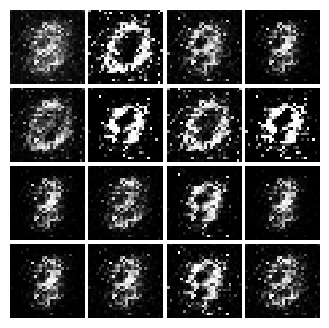

Epoch: 2, Iter: 1000, D: 1.437, G:1.382


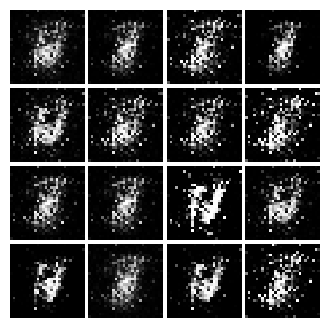

Epoch: 2, Iter: 1020, D: 1.17, G:1.381


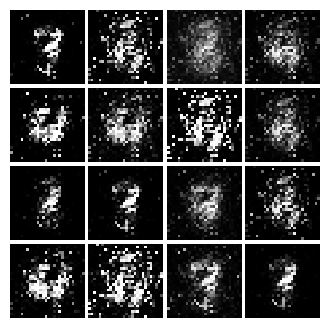

Epoch: 2, Iter: 1040, D: 0.9528, G:1.199


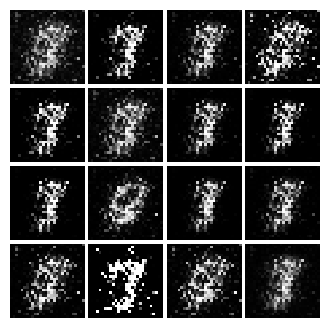

Epoch: 2, Iter: 1060, D: 0.9243, G:1.951


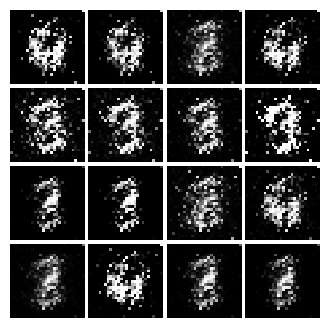

Epoch: 2, Iter: 1080, D: 1.238, G:1.164


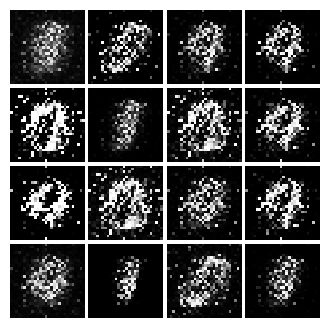

Epoch: 2, Iter: 1100, D: 1.015, G:1.093


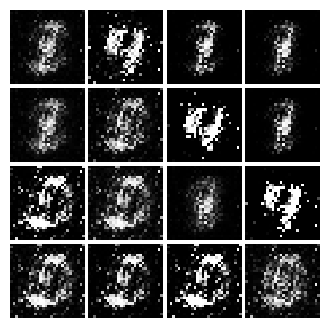

Epoch: 2, Iter: 1120, D: 1.293, G:1.488


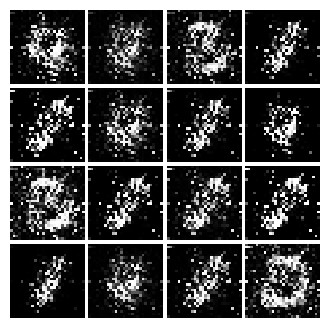

Epoch: 2, Iter: 1140, D: 1.328, G:1.205


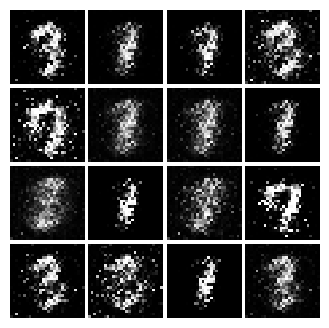

Epoch: 2, Iter: 1160, D: 1.09, G:1.973


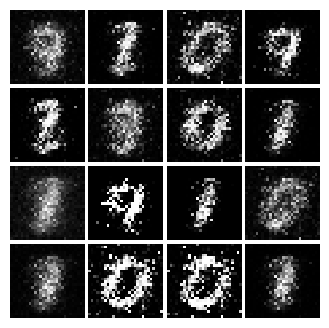

Epoch: 2, Iter: 1180, D: 1.161, G:0.9202


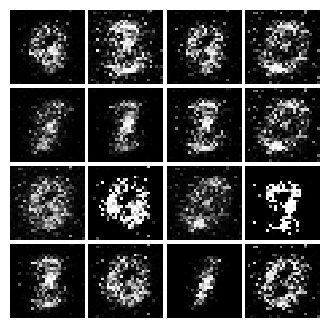

Epoch: 2, Iter: 1200, D: 1.066, G:1.171


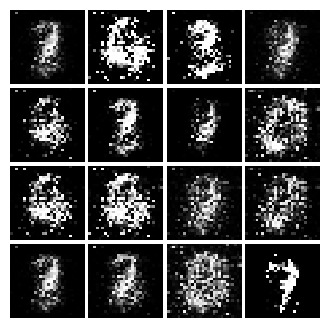

Epoch: 2, Iter: 1220, D: 1.051, G:1.294


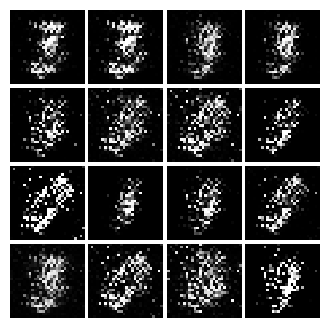

Epoch: 2, Iter: 1240, D: 0.9827, G:2.656


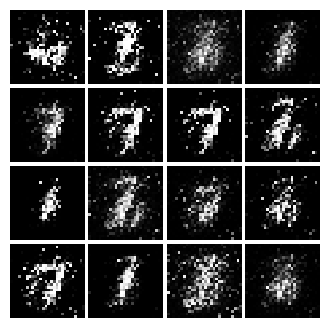

Epoch: 2, Iter: 1260, D: 1.207, G:1.232


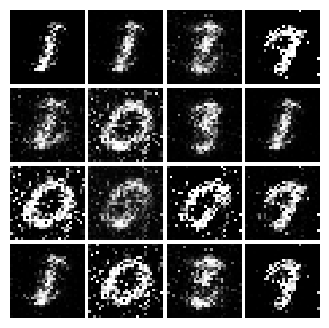

Epoch: 2, Iter: 1280, D: 1.307, G:1.178


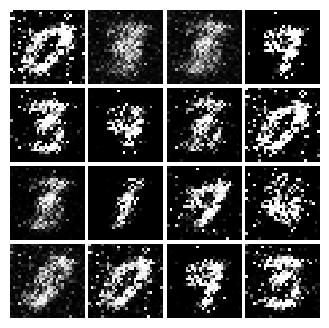

Epoch: 2, Iter: 1300, D: 1.594, G:1.629


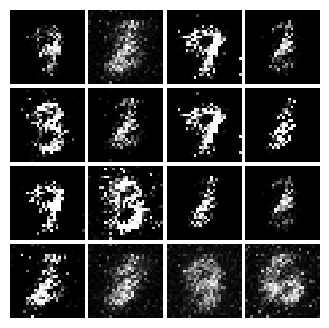

Epoch: 2, Iter: 1320, D: 1.718, G:0.6639


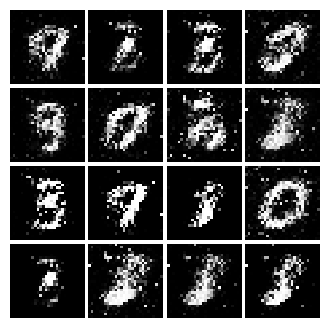

Epoch: 2, Iter: 1340, D: 1.304, G:1.004


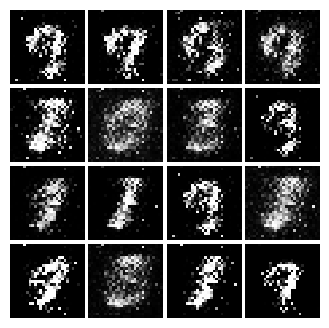

Epoch: 2, Iter: 1360, D: 1.227, G:1.228


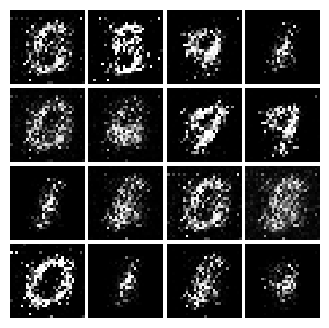

Epoch: 2, Iter: 1380, D: 1.355, G:0.6489


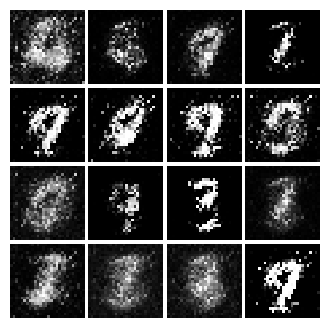

Epoch: 2, Iter: 1400, D: 1.245, G:0.9135


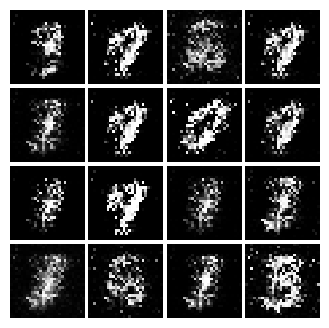

Epoch: 3, Iter: 1420, D: 1.203, G:1.178


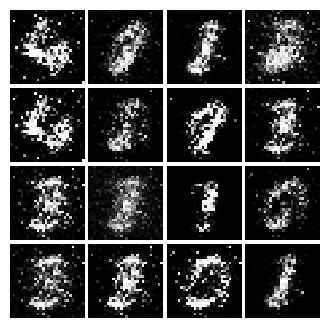

Epoch: 3, Iter: 1440, D: 1.439, G:1.781


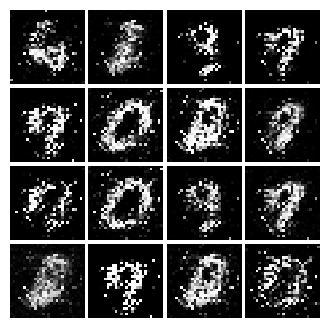

Epoch: 3, Iter: 1460, D: 1.312, G:1.617


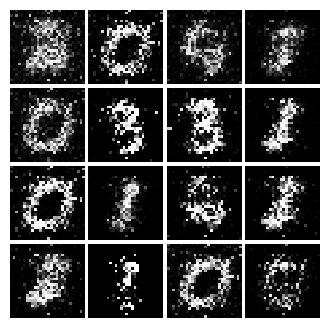

Epoch: 3, Iter: 1480, D: 1.11, G:1.404


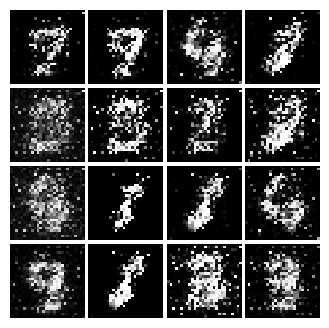

Epoch: 3, Iter: 1500, D: 1.241, G:1.597


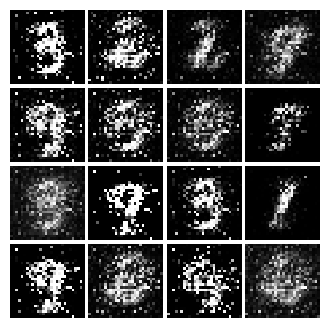

Epoch: 3, Iter: 1520, D: 1.504, G:0.94


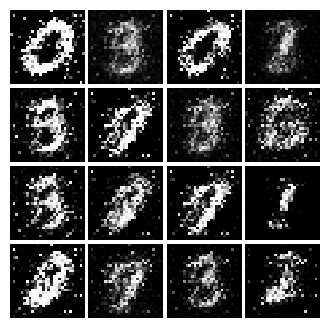

Epoch: 3, Iter: 1540, D: 1.262, G:0.9846


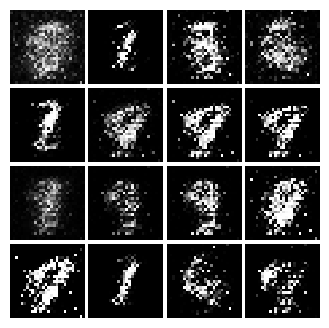

Epoch: 3, Iter: 1560, D: 1.22, G:1.467


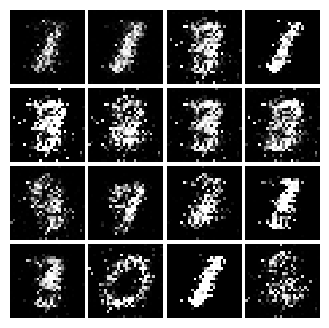

Epoch: 3, Iter: 1580, D: 1.838, G:0.342


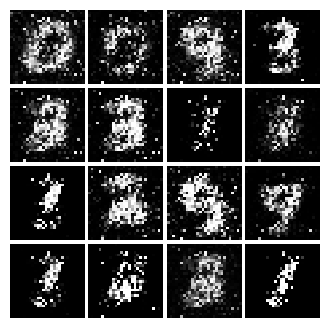

Epoch: 3, Iter: 1600, D: 1.146, G:1.521


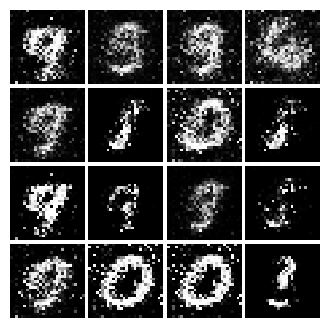

Epoch: 3, Iter: 1620, D: 1.261, G:1.111


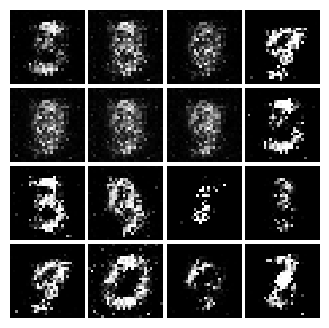

Epoch: 3, Iter: 1640, D: 1.208, G:1.866


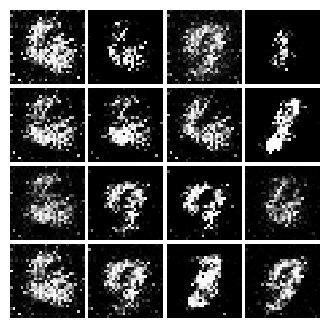

Epoch: 3, Iter: 1660, D: 1.228, G:1.027


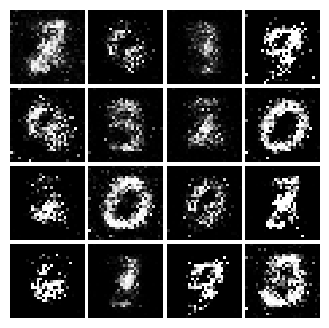

Epoch: 3, Iter: 1680, D: 1.221, G:0.9118


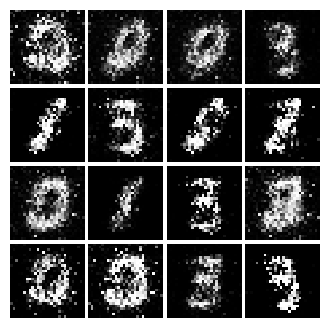

Epoch: 3, Iter: 1700, D: 1.442, G:2.007


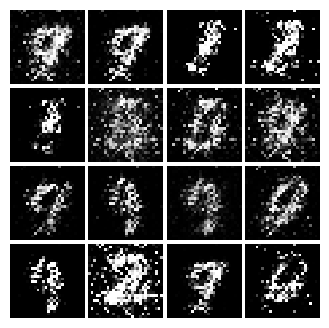

Epoch: 3, Iter: 1720, D: 1.289, G:0.8103


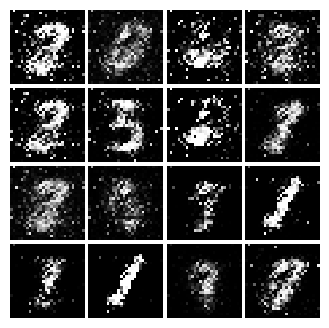

Epoch: 3, Iter: 1740, D: 1.268, G:0.8159


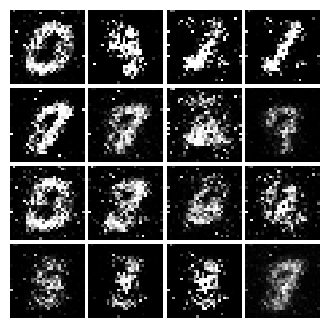

Epoch: 3, Iter: 1760, D: 1.248, G:0.9281


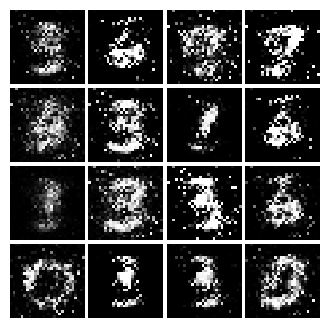

Epoch: 3, Iter: 1780, D: 1.279, G:0.9172


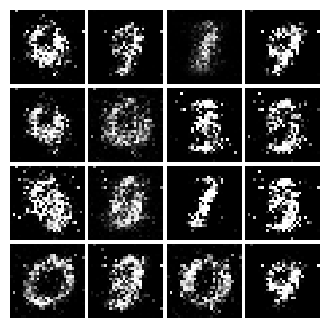

Epoch: 3, Iter: 1800, D: 1.321, G:0.8861


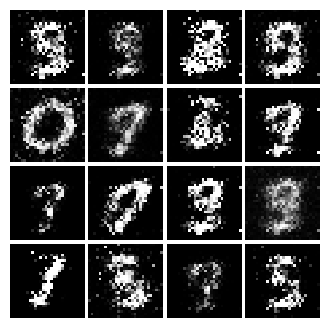

Epoch: 3, Iter: 1820, D: 1.355, G:0.856


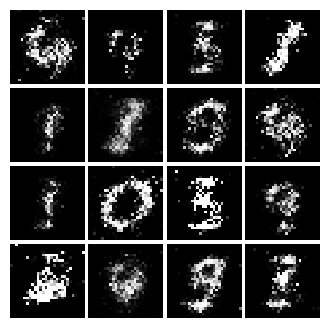

Epoch: 3, Iter: 1840, D: 1.352, G:0.8946


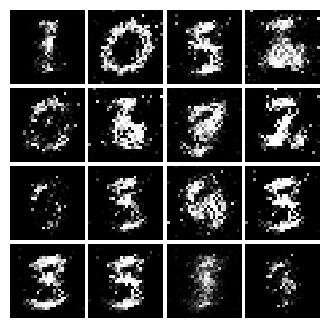

Epoch: 3, Iter: 1860, D: 1.329, G:0.7135


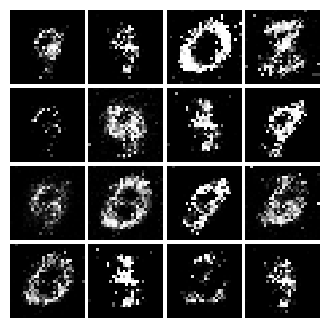

Epoch: 4, Iter: 1880, D: 1.35, G:0.8396


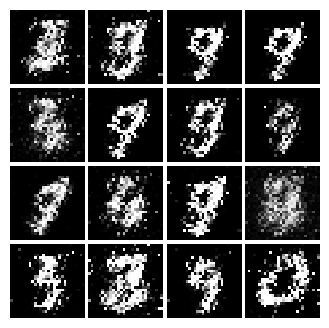

Epoch: 4, Iter: 1900, D: 1.33, G:0.6749


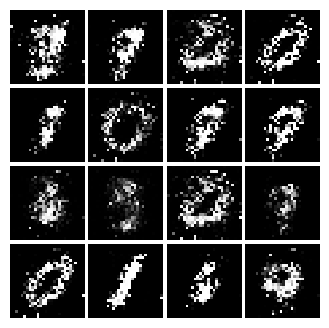

Epoch: 4, Iter: 1920, D: 1.293, G:0.8003


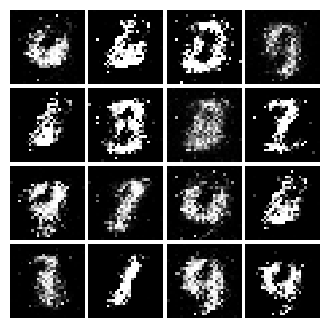

Epoch: 4, Iter: 1940, D: 1.324, G:0.4582


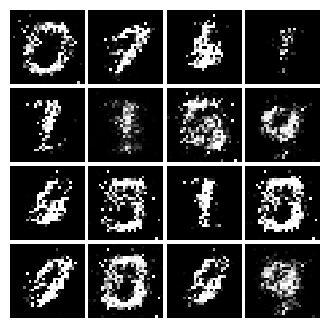

Epoch: 4, Iter: 1960, D: 1.282, G:0.9671


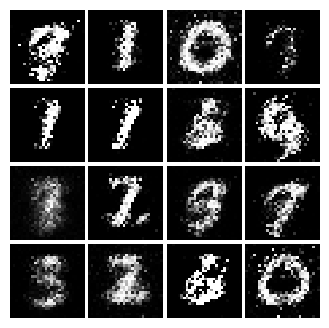

Epoch: 4, Iter: 1980, D: 1.27, G:0.9026


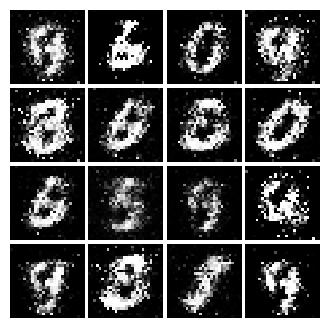

Epoch: 4, Iter: 2000, D: 1.228, G:0.9361


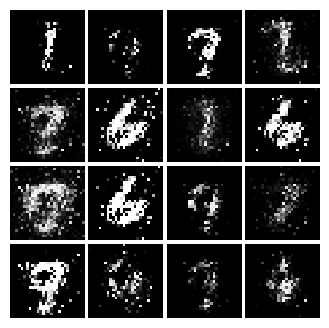

Epoch: 4, Iter: 2020, D: 1.257, G:0.8477


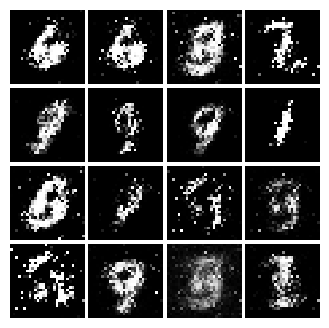

Epoch: 4, Iter: 2040, D: 1.361, G:0.9314


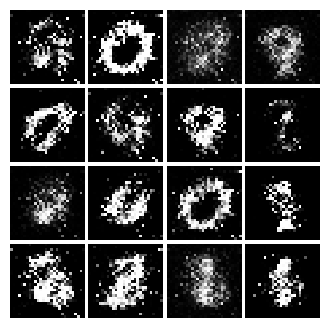

Epoch: 4, Iter: 2060, D: 1.409, G:0.8721


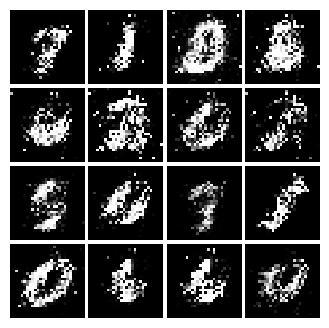

Epoch: 4, Iter: 2080, D: 1.344, G:0.9084


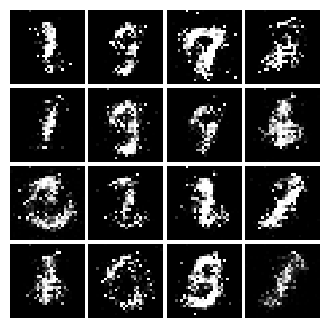

Epoch: 4, Iter: 2100, D: 1.31, G:0.9032


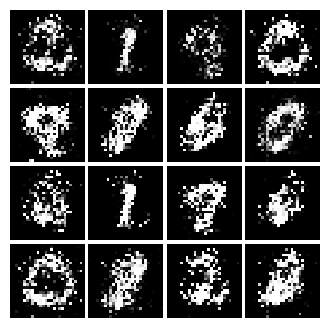

Epoch: 4, Iter: 2120, D: 1.202, G:0.9549


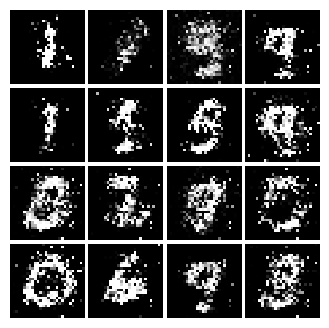

Epoch: 4, Iter: 2140, D: 1.393, G:0.7281


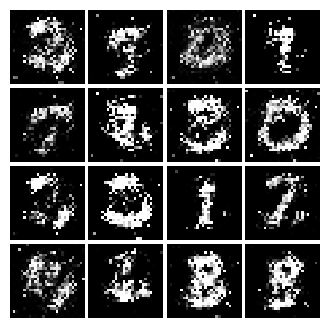

Epoch: 4, Iter: 2160, D: 1.375, G:1.118


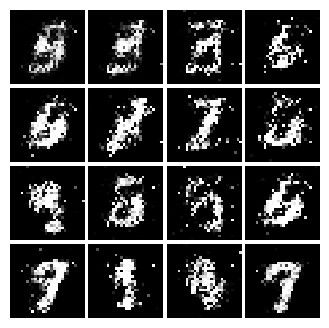

Epoch: 4, Iter: 2180, D: 1.343, G:0.7988


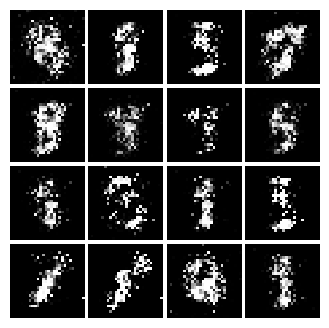

Epoch: 4, Iter: 2200, D: 1.312, G:0.9003


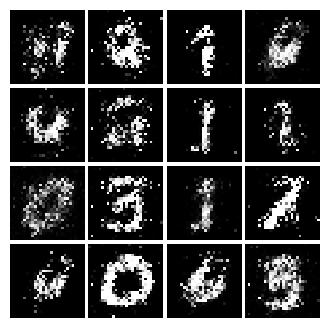

Epoch: 4, Iter: 2220, D: 1.094, G:1.226


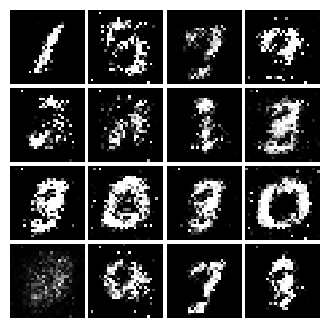

Epoch: 4, Iter: 2240, D: 1.39, G:0.7116


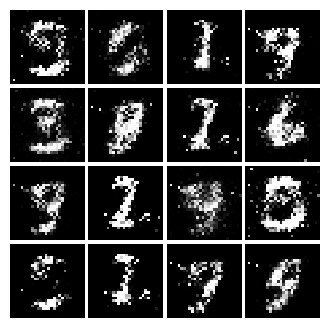

Epoch: 4, Iter: 2260, D: 1.389, G:0.8372


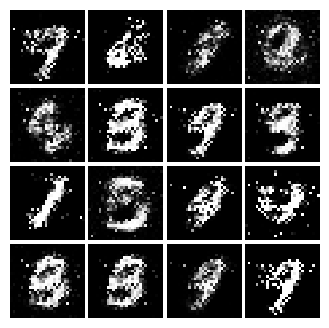

Epoch: 4, Iter: 2280, D: 1.368, G:0.9395


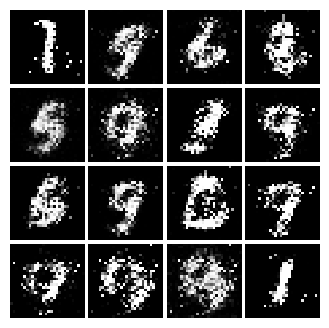

Epoch: 4, Iter: 2300, D: 1.352, G:0.7527


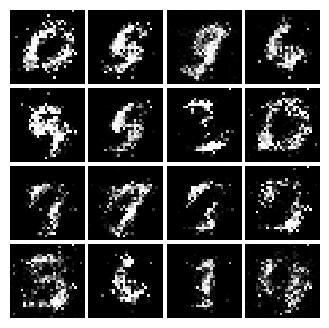

Epoch: 4, Iter: 2320, D: 1.331, G:0.7934


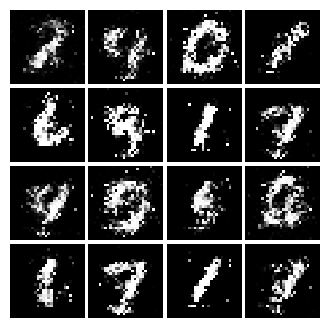

Epoch: 4, Iter: 2340, D: 1.191, G:0.9425


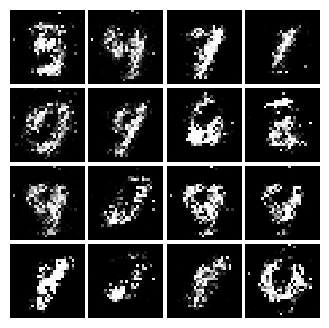

Epoch: 5, Iter: 2360, D: 1.168, G:1.231


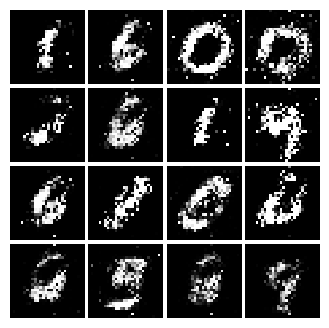

Epoch: 5, Iter: 2380, D: 1.288, G:0.7857


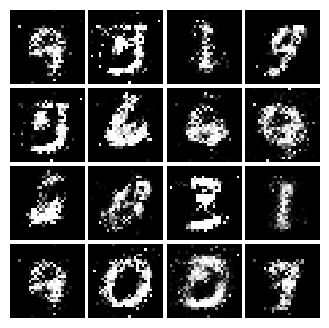

Epoch: 5, Iter: 2400, D: 1.344, G:0.8593


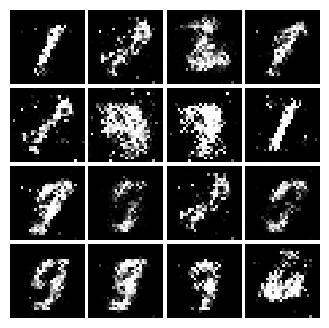

Epoch: 5, Iter: 2420, D: 1.242, G:0.9191


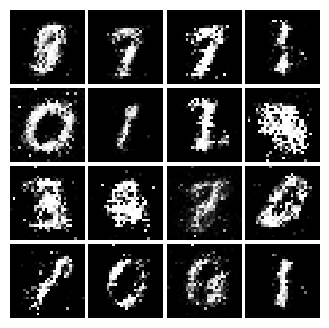

Epoch: 5, Iter: 2440, D: 1.256, G:0.8534


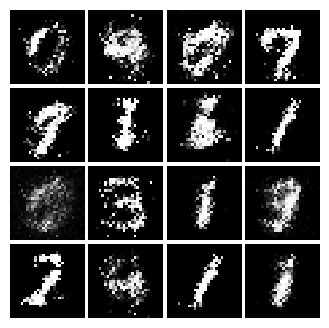

Epoch: 5, Iter: 2460, D: 1.599, G:0.6181


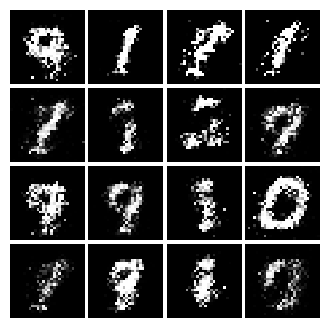

Epoch: 5, Iter: 2480, D: 1.301, G:0.8653


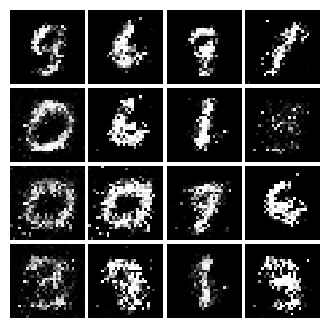

Epoch: 5, Iter: 2500, D: 1.231, G:0.829


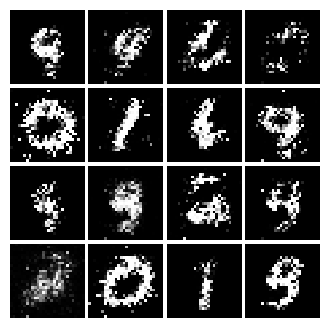

Epoch: 5, Iter: 2520, D: 1.29, G:1.159


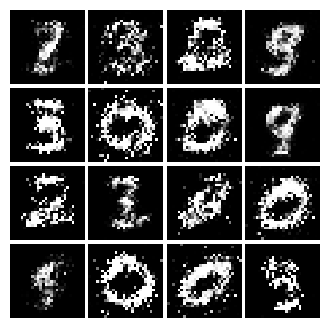

Epoch: 5, Iter: 2540, D: 1.425, G:0.736


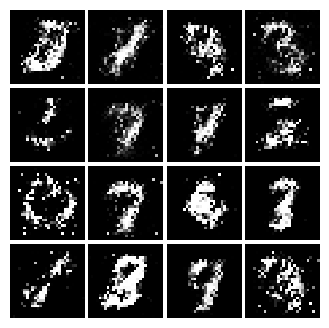

Epoch: 5, Iter: 2560, D: 1.318, G:0.8039


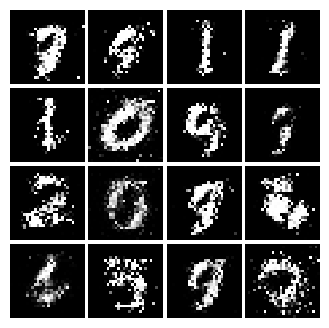

Epoch: 5, Iter: 2580, D: 1.248, G:0.9097


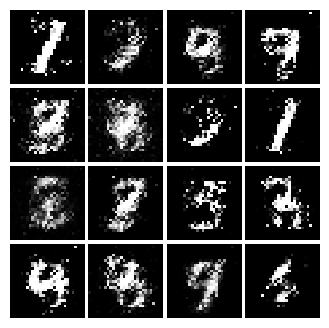

Epoch: 5, Iter: 2600, D: 1.485, G:0.678


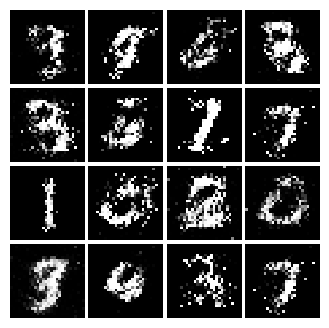

Epoch: 5, Iter: 2620, D: 1.316, G:1.043


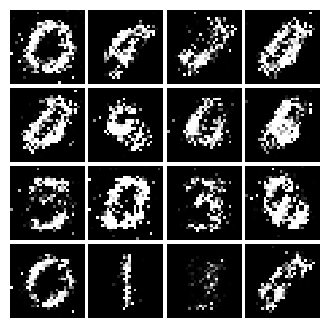

Epoch: 5, Iter: 2640, D: 1.288, G:1.138


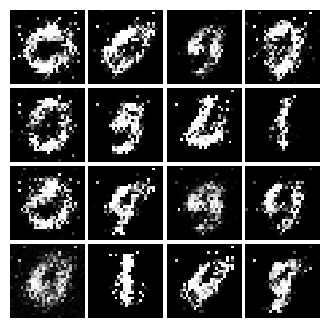

Epoch: 5, Iter: 2660, D: 1.304, G:0.8432


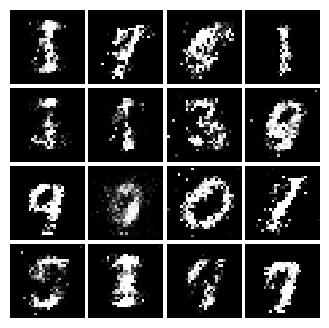

Epoch: 5, Iter: 2680, D: 1.539, G:0.8277


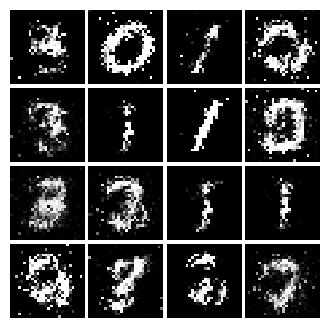

Epoch: 5, Iter: 2700, D: 1.319, G:0.7918


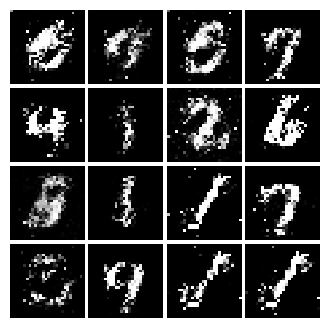

Epoch: 5, Iter: 2720, D: 1.293, G:0.809


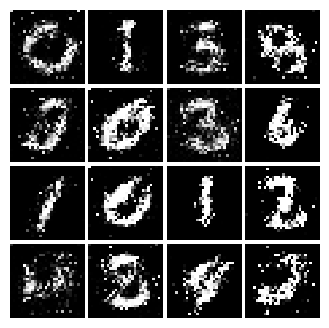

Epoch: 5, Iter: 2740, D: 1.237, G:0.8217


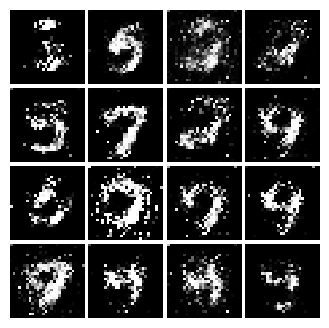

Epoch: 5, Iter: 2760, D: 1.3, G:0.7622


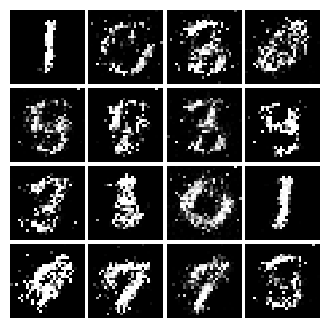

Epoch: 5, Iter: 2780, D: 1.202, G:0.8984


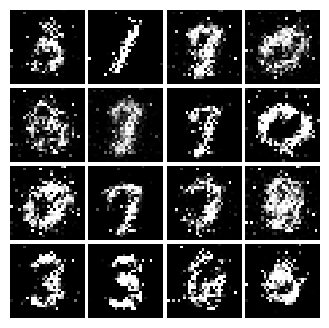

Epoch: 5, Iter: 2800, D: 1.353, G:0.8486


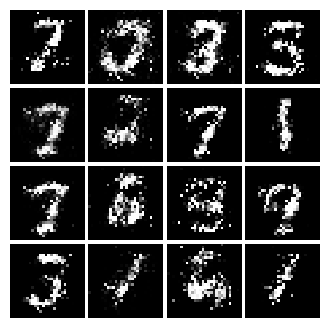

Epoch: 6, Iter: 2820, D: 1.273, G:1.074


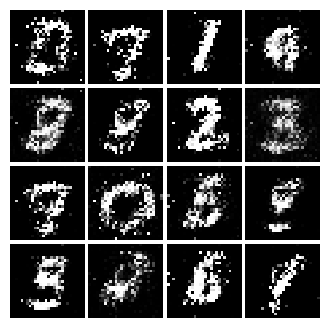

Epoch: 6, Iter: 2840, D: 1.296, G:0.9705


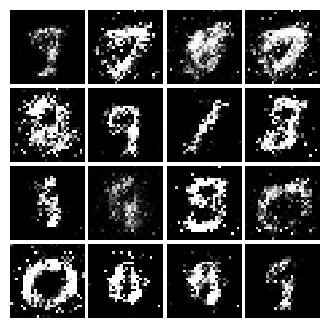

Epoch: 6, Iter: 2860, D: 1.191, G:0.7776


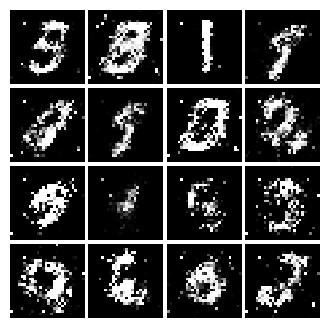

Epoch: 6, Iter: 2880, D: 1.247, G:0.8644


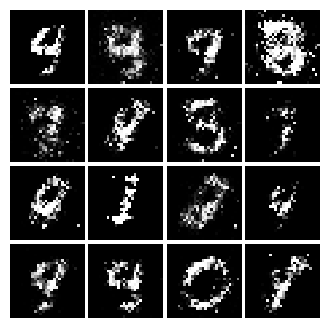

Epoch: 6, Iter: 2900, D: 1.3, G:0.8484


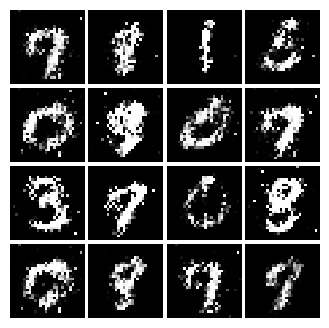

Epoch: 6, Iter: 2920, D: 1.26, G:0.9242


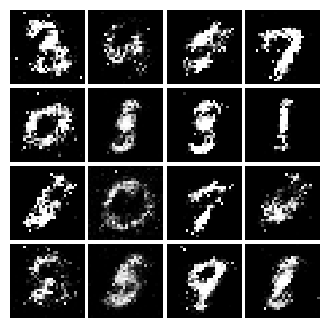

Epoch: 6, Iter: 2940, D: 1.451, G:1.004


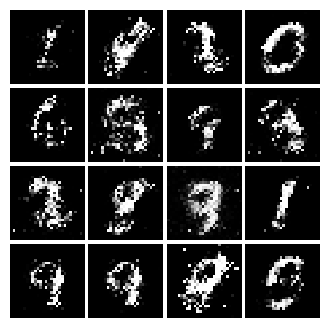

Epoch: 6, Iter: 2960, D: 1.32, G:0.7979


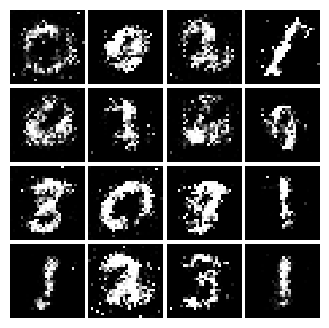

Epoch: 6, Iter: 2980, D: 1.343, G:0.7935


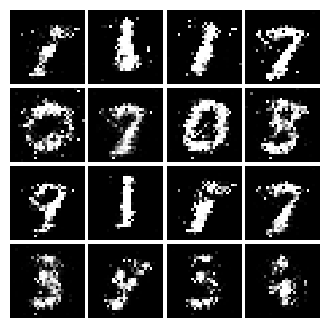

Epoch: 6, Iter: 3000, D: 1.303, G:0.8399


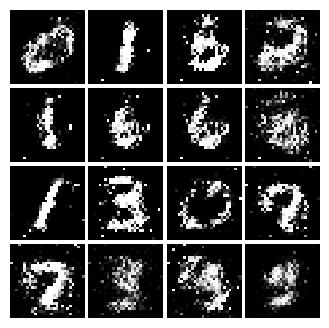

Epoch: 6, Iter: 3020, D: 1.486, G:0.9861


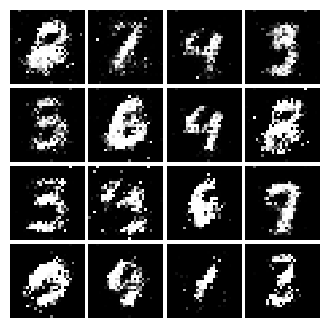

Epoch: 6, Iter: 3040, D: 1.342, G:0.9087


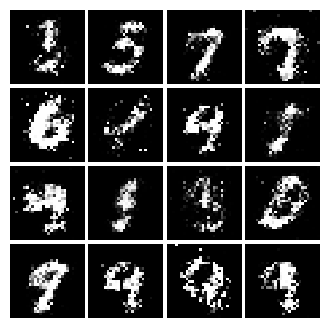

Epoch: 6, Iter: 3060, D: 1.378, G:0.7876


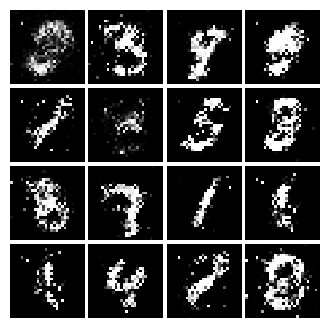

Epoch: 6, Iter: 3080, D: 1.39, G:0.7743


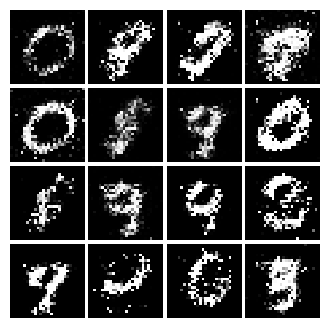

Epoch: 6, Iter: 3100, D: 1.412, G:0.8332


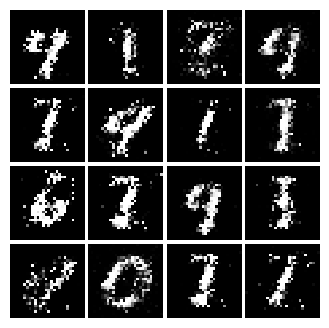

Epoch: 6, Iter: 3120, D: 1.234, G:1.049


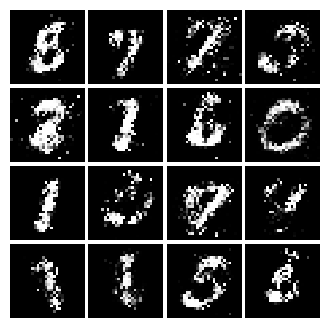

Epoch: 6, Iter: 3140, D: 1.388, G:0.8139


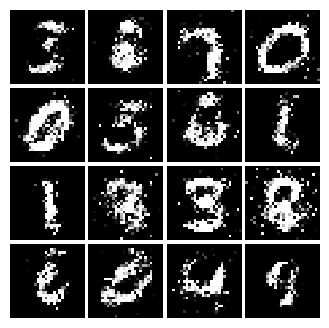

Epoch: 6, Iter: 3160, D: 1.193, G:1.024


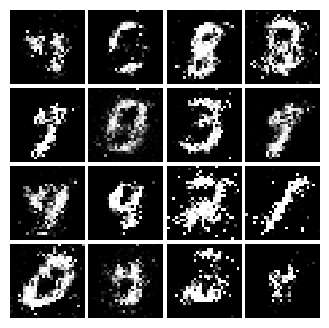

Epoch: 6, Iter: 3180, D: 1.341, G:0.805


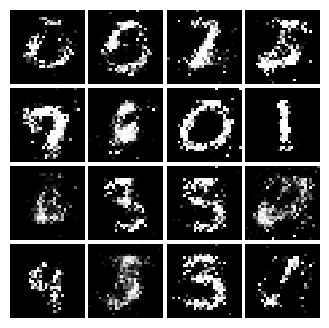

Epoch: 6, Iter: 3200, D: 1.329, G:1.087


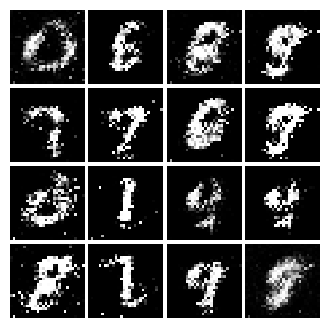

Epoch: 6, Iter: 3220, D: 1.349, G:1.272


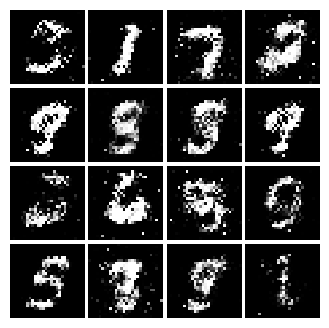

Epoch: 6, Iter: 3240, D: 1.291, G:0.7846


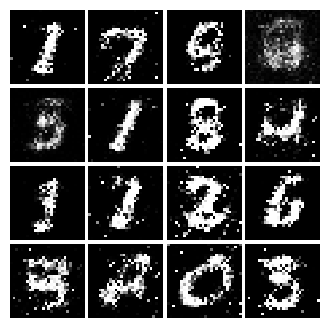

Epoch: 6, Iter: 3260, D: 1.424, G:0.8719


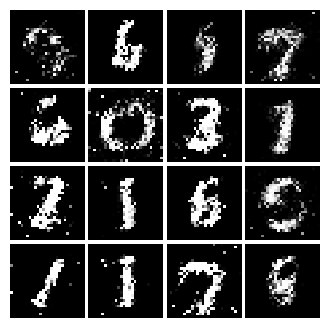

Epoch: 6, Iter: 3280, D: 1.253, G:0.8737


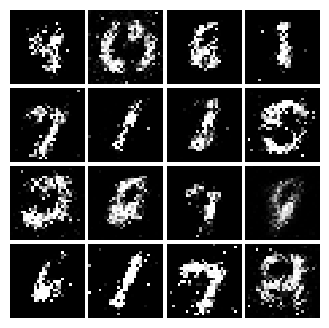

Epoch: 7, Iter: 3300, D: 1.241, G:1.031


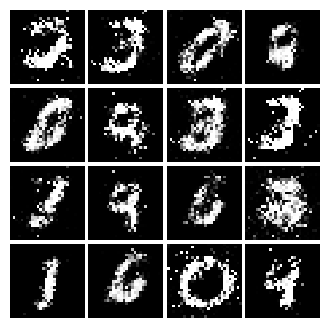

Epoch: 7, Iter: 3320, D: 1.169, G:0.831


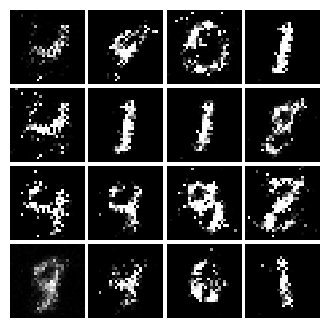

Epoch: 7, Iter: 3340, D: 1.278, G:0.9291


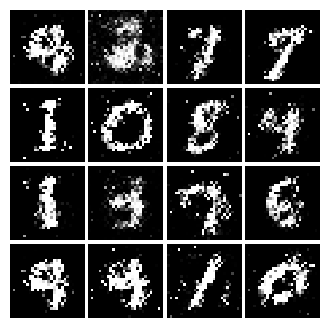

Epoch: 7, Iter: 3360, D: 1.219, G:0.8534


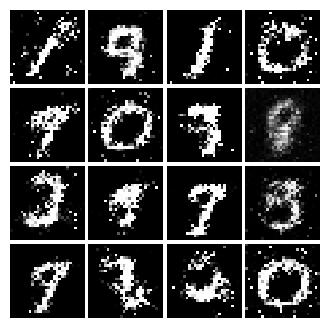

Epoch: 7, Iter: 3380, D: 1.326, G:0.9481


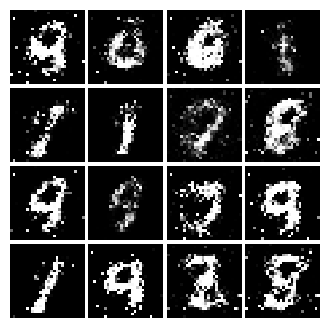

Epoch: 7, Iter: 3400, D: 1.424, G:0.8569


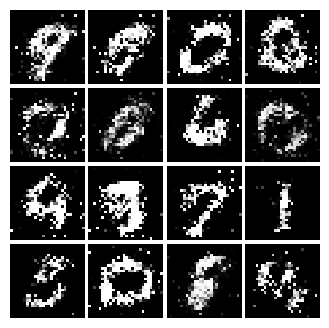

Epoch: 7, Iter: 3420, D: 1.311, G:0.8894


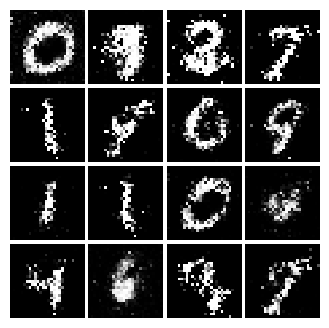

Epoch: 7, Iter: 3440, D: 1.355, G:0.8726


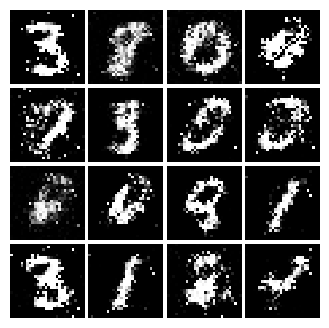

Epoch: 7, Iter: 3460, D: 1.322, G:0.7678


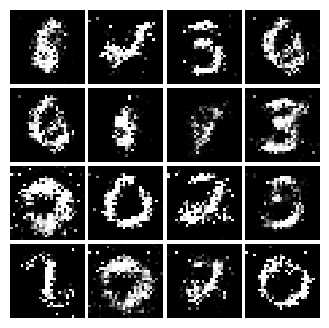

Epoch: 7, Iter: 3480, D: 1.285, G:2.39


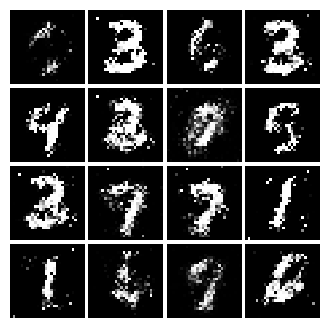

Epoch: 7, Iter: 3500, D: 1.391, G:0.7777


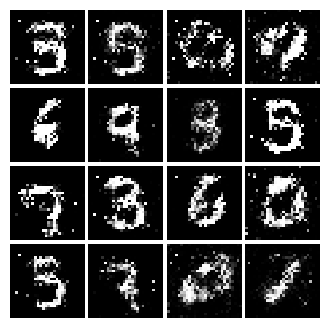

Epoch: 7, Iter: 3520, D: 1.316, G:0.8338


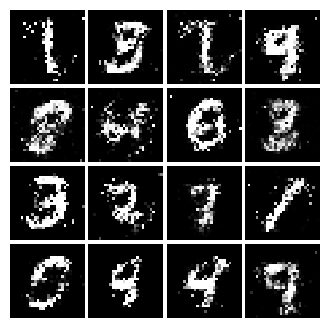

Epoch: 7, Iter: 3540, D: 1.254, G:0.73


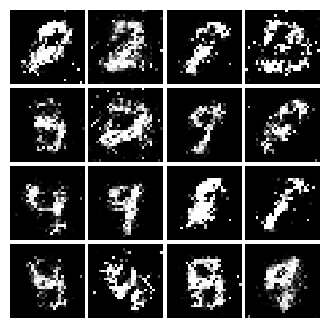

Epoch: 7, Iter: 3560, D: 1.247, G:0.7963


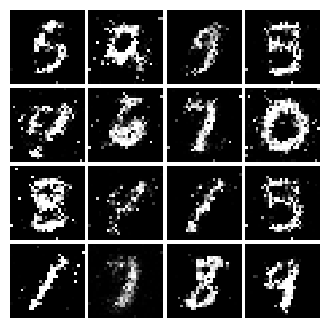

Epoch: 7, Iter: 3580, D: 1.286, G:0.8484


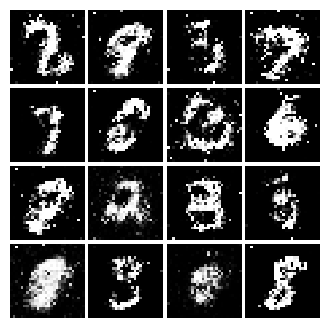

Epoch: 7, Iter: 3600, D: 1.379, G:0.7907


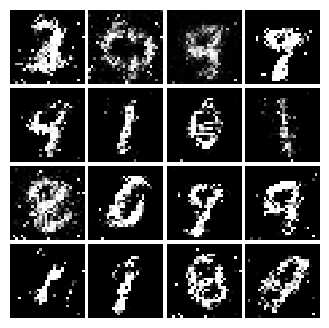

Epoch: 7, Iter: 3620, D: 1.242, G:0.8082


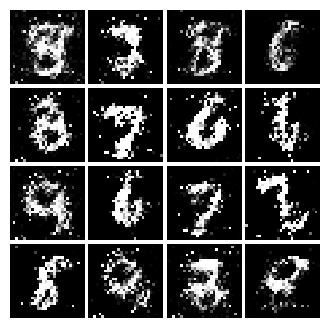

Epoch: 7, Iter: 3640, D: 1.382, G:0.8338


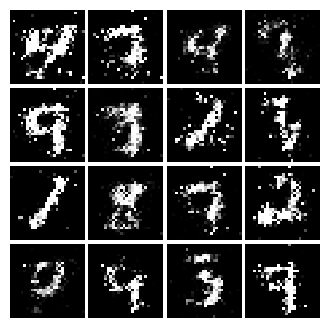

Epoch: 7, Iter: 3660, D: 1.131, G:0.8436


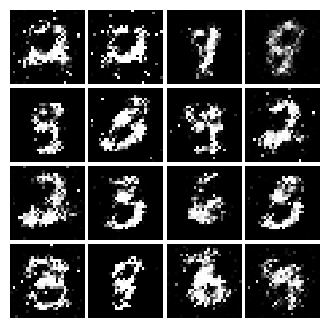

Epoch: 7, Iter: 3680, D: 1.358, G:0.8336


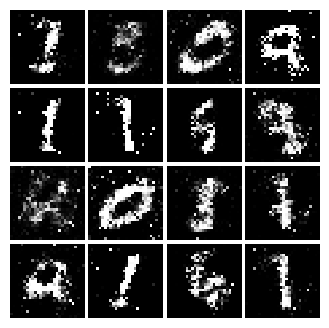

Epoch: 7, Iter: 3700, D: 1.351, G:0.9825


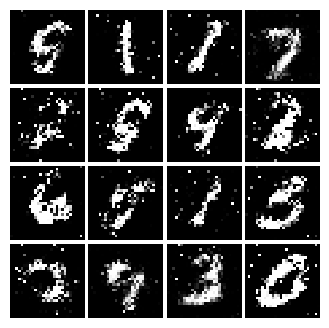

Epoch: 7, Iter: 3720, D: 1.346, G:0.8701


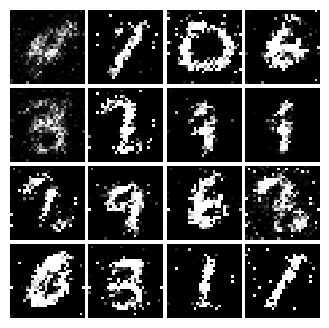

Epoch: 7, Iter: 3740, D: 1.706, G:0.7351


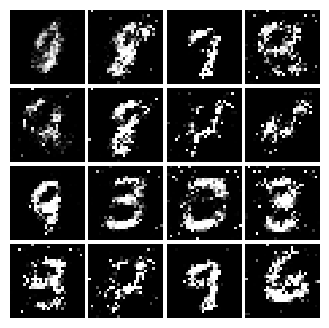

Epoch: 8, Iter: 3760, D: 1.317, G:0.8522


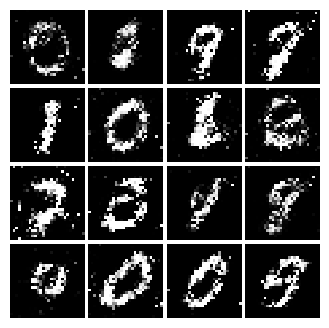

Epoch: 8, Iter: 3780, D: 1.361, G:0.836


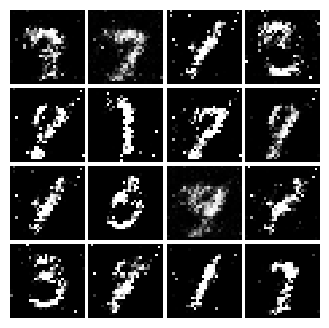

Epoch: 8, Iter: 3800, D: 1.271, G:0.8045


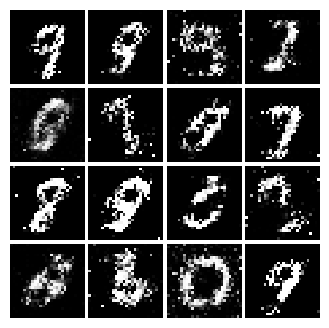

Epoch: 8, Iter: 3820, D: 1.312, G:0.9205


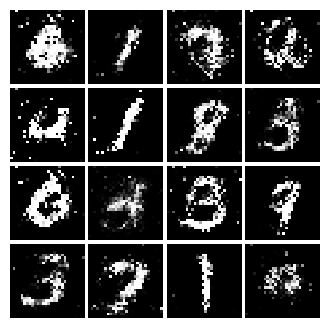

Epoch: 8, Iter: 3840, D: 1.469, G:0.8911


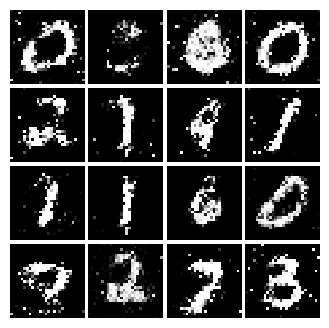

Epoch: 8, Iter: 3860, D: 1.372, G:0.7044


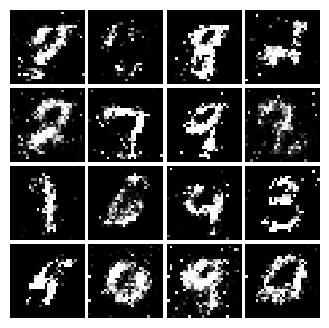

Epoch: 8, Iter: 3880, D: 1.318, G:0.9103


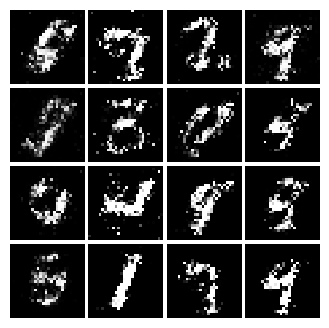

Epoch: 8, Iter: 3900, D: 1.374, G:0.8544


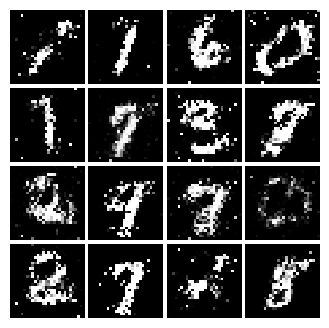

Epoch: 8, Iter: 3920, D: 1.318, G:0.8008


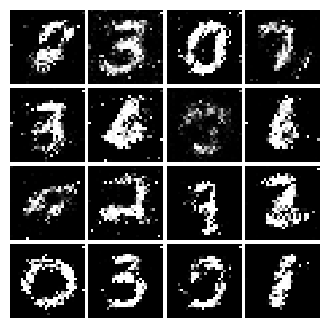

Epoch: 8, Iter: 3940, D: 1.379, G:0.817


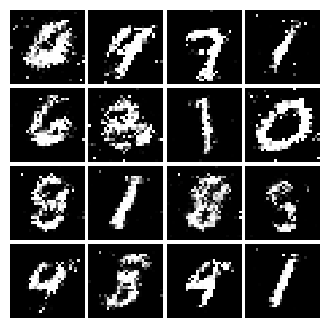

Epoch: 8, Iter: 3960, D: 1.335, G:0.9242


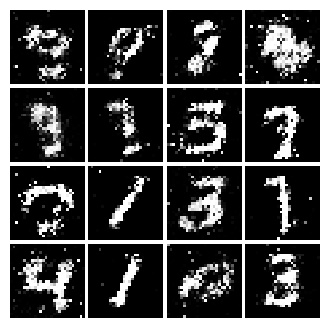

Epoch: 8, Iter: 3980, D: 1.257, G:0.8909


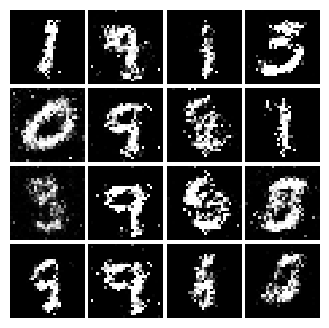

Epoch: 8, Iter: 4000, D: 1.371, G:0.822


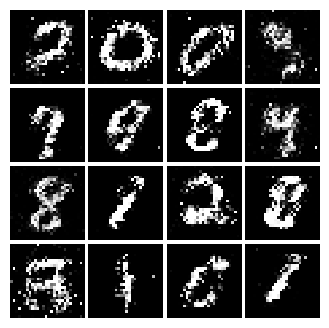

Epoch: 8, Iter: 4020, D: 1.369, G:0.746


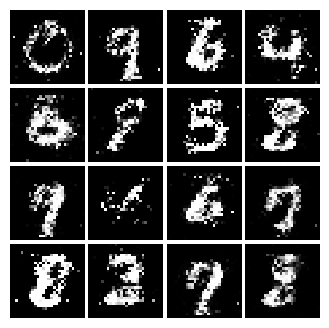

Epoch: 8, Iter: 4040, D: 1.319, G:0.7924


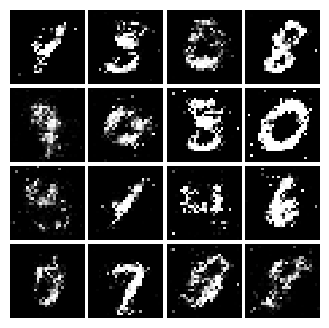

Epoch: 8, Iter: 4060, D: 1.39, G:0.7171


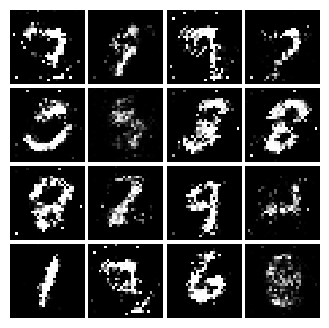

Epoch: 8, Iter: 4080, D: 1.42, G:0.6685


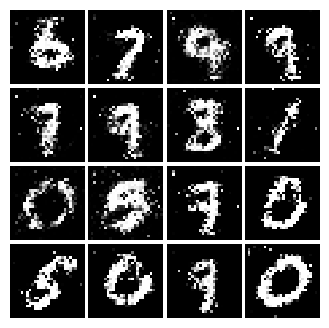

Epoch: 8, Iter: 4100, D: 1.342, G:0.8584


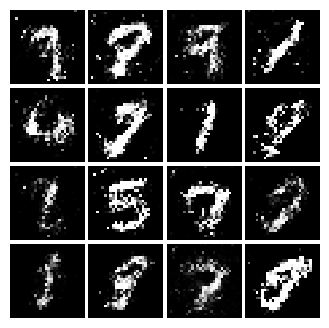

Epoch: 8, Iter: 4120, D: 1.332, G:0.8235


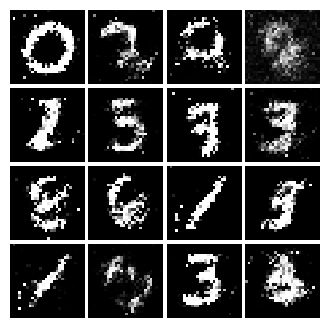

Epoch: 8, Iter: 4140, D: 1.32, G:0.7086


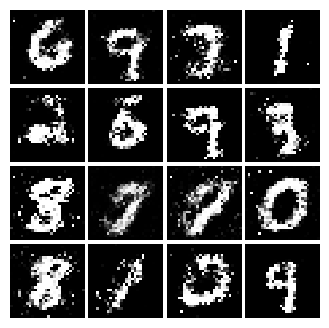

Epoch: 8, Iter: 4160, D: 1.326, G:0.8873


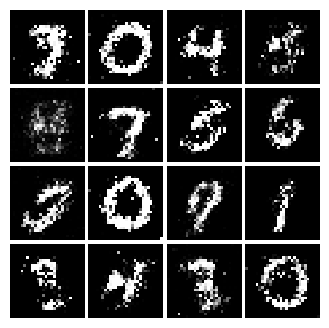

Epoch: 8, Iter: 4180, D: 1.333, G:0.8266


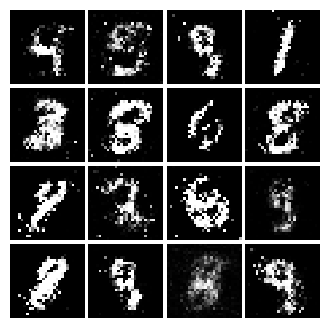

Epoch: 8, Iter: 4200, D: 1.303, G:0.8242


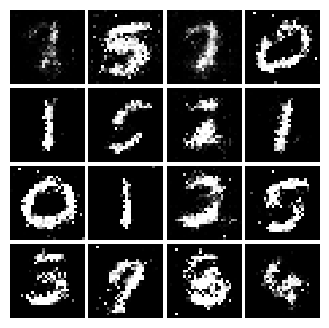

Epoch: 8, Iter: 4220, D: 1.415, G:0.7949


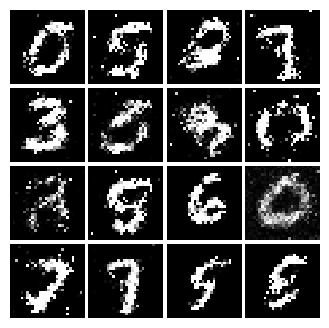

Epoch: 9, Iter: 4240, D: 1.327, G:0.7199


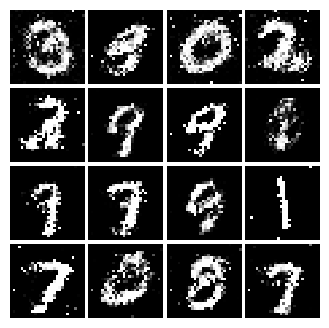

Epoch: 9, Iter: 4260, D: 1.335, G:0.7705


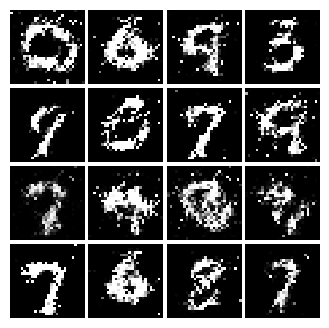

Epoch: 9, Iter: 4280, D: 1.373, G:0.8467


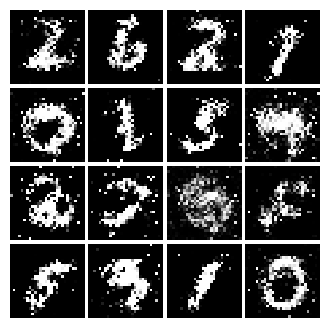

Epoch: 9, Iter: 4300, D: 1.361, G:0.7819


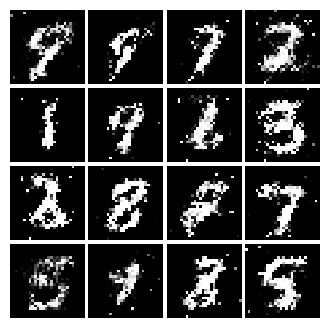

Epoch: 9, Iter: 4320, D: 1.368, G:0.8186


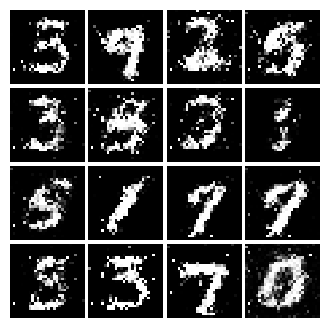

Epoch: 9, Iter: 4340, D: 1.35, G:0.91


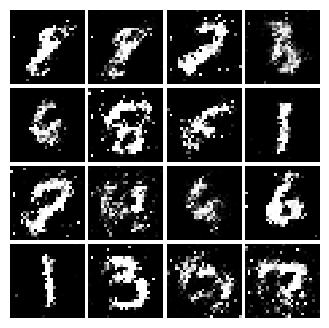

Epoch: 9, Iter: 4360, D: 1.367, G:0.8401


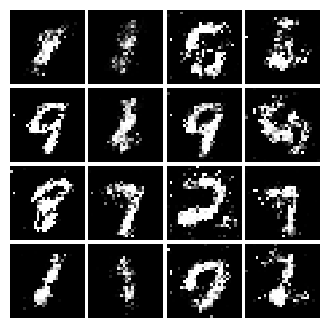

Epoch: 9, Iter: 4380, D: 1.393, G:0.7947


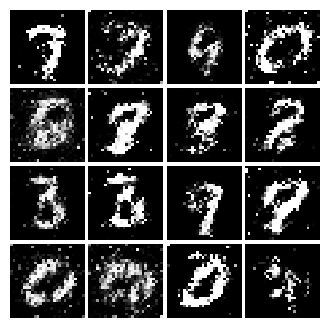

Epoch: 9, Iter: 4400, D: 1.274, G:0.7845


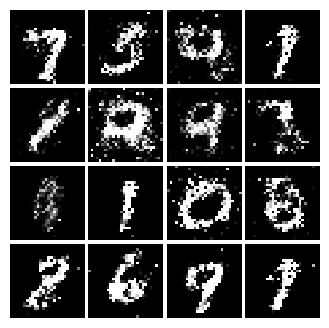

Epoch: 9, Iter: 4420, D: 1.355, G:0.8365


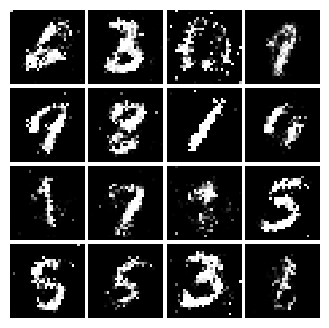

Epoch: 9, Iter: 4440, D: 1.38, G:0.8113


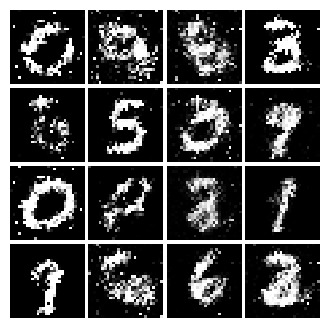

Epoch: 9, Iter: 4460, D: 1.354, G:0.7804


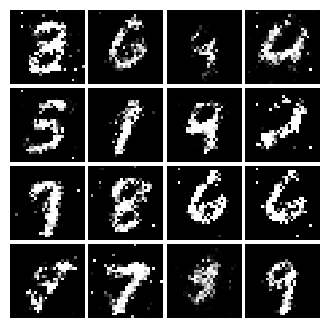

Epoch: 9, Iter: 4480, D: 1.335, G:0.816


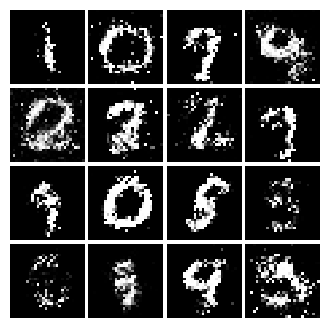

Epoch: 9, Iter: 4500, D: 1.438, G:0.7937


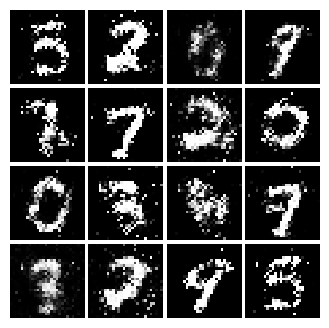

Epoch: 9, Iter: 4520, D: 1.383, G:0.7574


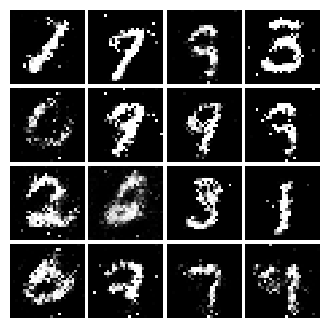

Epoch: 9, Iter: 4540, D: 1.345, G:0.7967


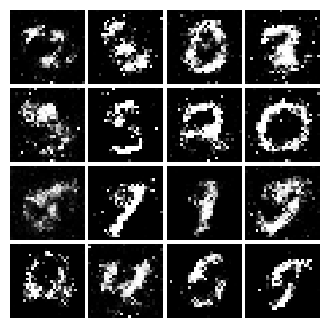

Epoch: 9, Iter: 4560, D: 1.351, G:0.8806


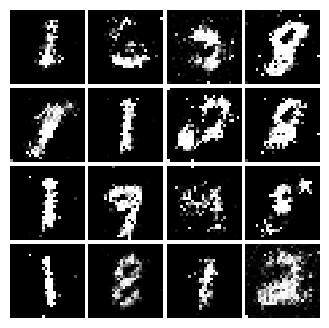

Epoch: 9, Iter: 4580, D: 1.304, G:0.7492


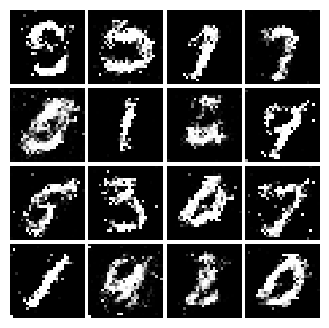

Epoch: 9, Iter: 4600, D: 1.332, G:0.784


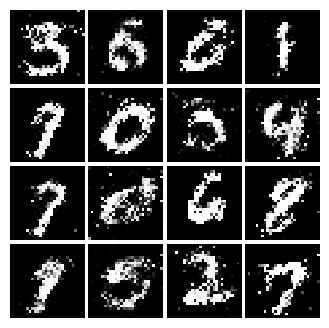

Epoch: 9, Iter: 4620, D: 1.369, G:0.7617


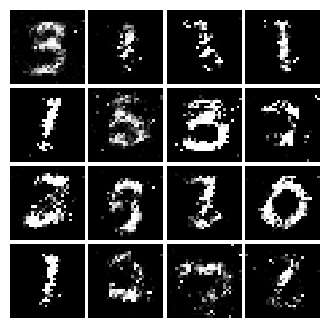

Epoch: 9, Iter: 4640, D: 1.335, G:1.009


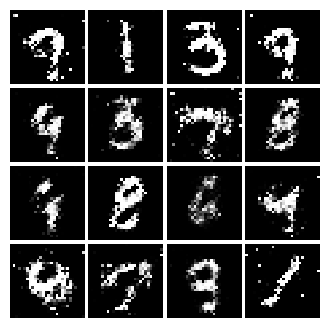

Epoch: 9, Iter: 4660, D: 1.335, G:0.8028


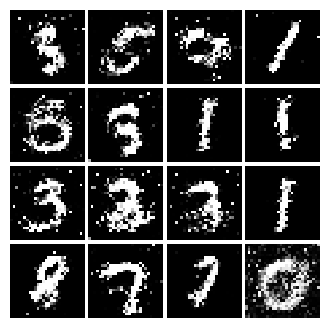

Epoch: 9, Iter: 4680, D: 1.326, G:0.7513


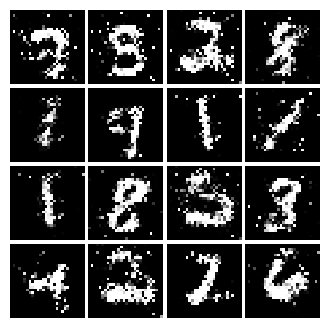

Final images


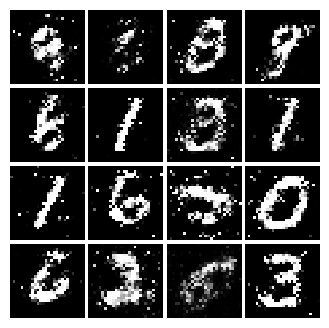

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [30]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################
    
    # Calculate the target values for real and fake data
    target_real = tf.ones_like(scores_real)
    target_fake = tf.zeros_like(scores_fake)

    # Compute the loss for real and fake data
    loss_real = tf.reduce_mean(tf.square(scores_real - target_real))
    loss_fake = tf.reduce_mean(tf.square(scores_fake - target_fake))

    # The total loss is the average of the losses for real and fake data
    loss = 0.5 * (loss_real + loss_fake)

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    # Calculate the target values for real and fake data
    target_fake = tf.ones_like(scores_fake)

    # Compute the loss for fake data
    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - target_fake))
    
    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [31]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):

    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 3.549, G:0.4127


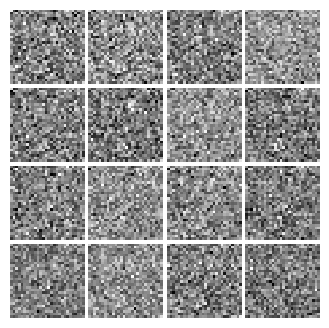

Epoch: 0, Iter: 20, D: 0.06946, G:0.6683


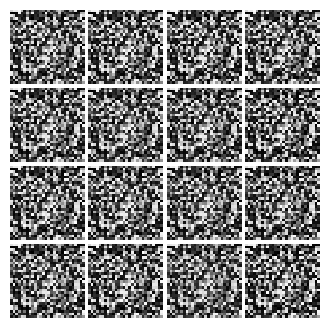

Epoch: 0, Iter: 40, D: 0.02433, G:0.7726


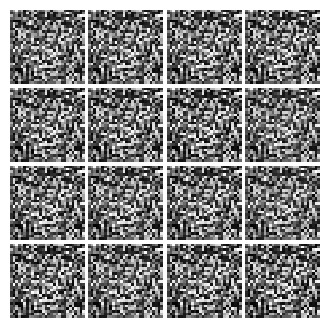

Epoch: 0, Iter: 60, D: 0.02127, G:0.7519


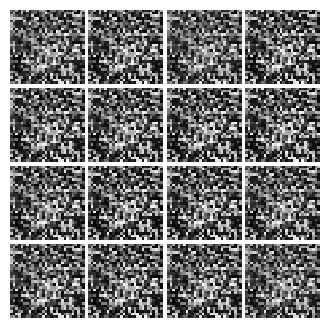

Epoch: 0, Iter: 80, D: 0.03429, G:0.4745


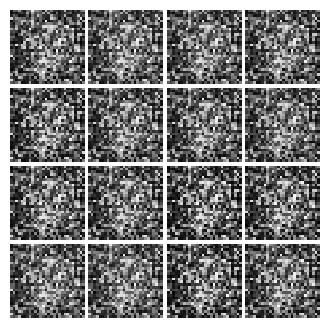

Epoch: 0, Iter: 100, D: 0.01525, G:0.6985


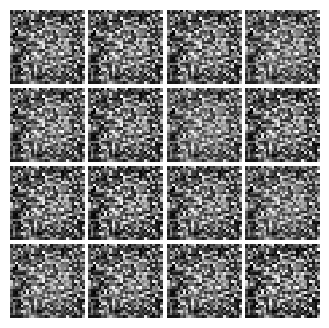

Epoch: 0, Iter: 120, D: 0.2735, G:0.2988


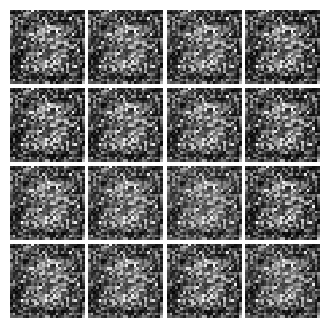

Epoch: 0, Iter: 140, D: 0.03793, G:0.5087


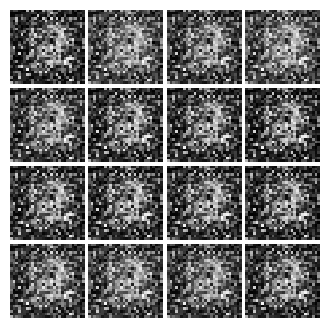

Epoch: 0, Iter: 160, D: 0.1027, G:0.643


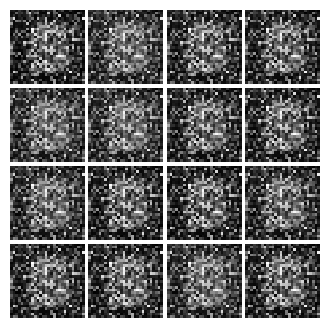

Epoch: 0, Iter: 180, D: 0.3591, G:0.4035


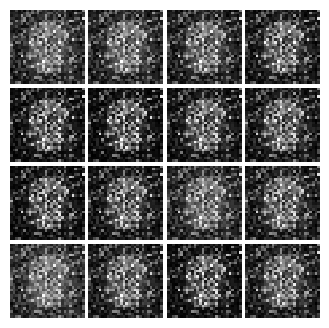

Epoch: 0, Iter: 200, D: 1.506, G:0.1809


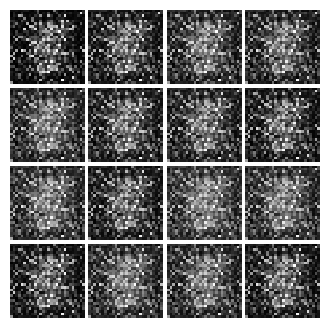

Epoch: 0, Iter: 220, D: 0.2345, G:0.411


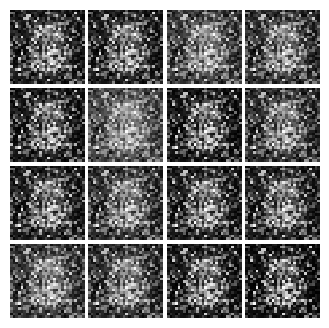

Epoch: 0, Iter: 240, D: 0.1734, G:0.4063


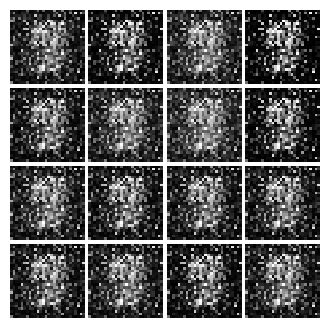

Epoch: 0, Iter: 260, D: 0.06379, G:0.5224


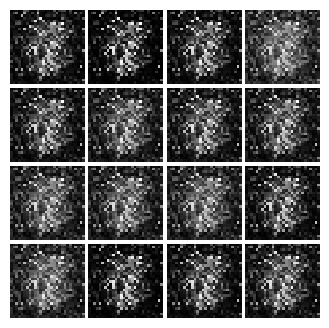

Epoch: 0, Iter: 280, D: 0.09549, G:0.5207


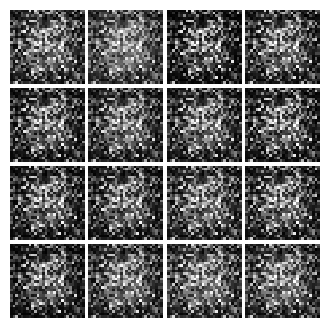

Epoch: 0, Iter: 300, D: 0.2361, G:0.2898


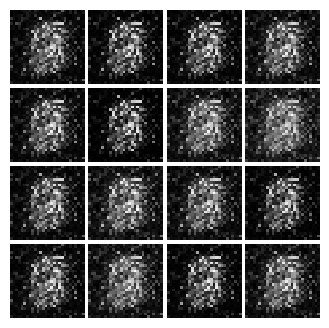

Epoch: 0, Iter: 320, D: 0.09892, G:0.1858


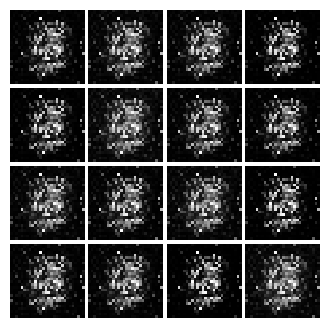

Epoch: 0, Iter: 340, D: 0.1761, G:0.4433


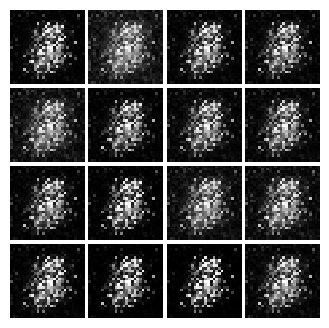

Epoch: 0, Iter: 360, D: 0.109, G:0.4047


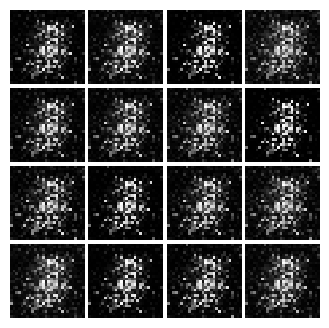

Epoch: 0, Iter: 380, D: 0.08586, G:0.4255


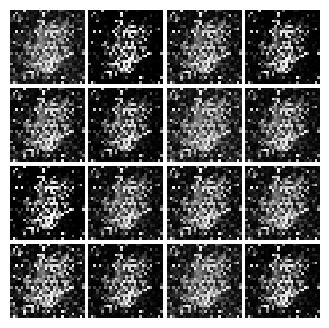

Epoch: 0, Iter: 400, D: 0.2357, G:0.9138


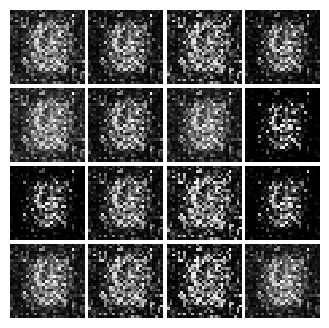

Epoch: 0, Iter: 420, D: 0.1335, G:0.4808


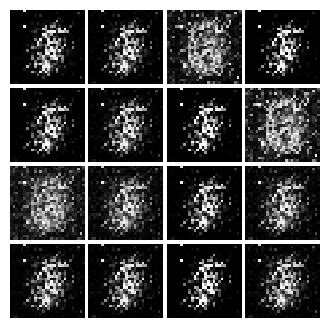

Epoch: 0, Iter: 440, D: 0.5833, G:0.306


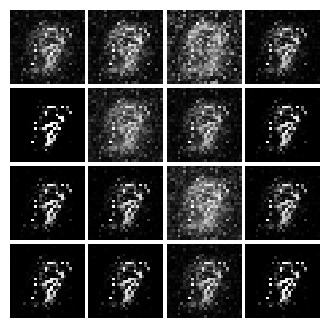

Epoch: 0, Iter: 460, D: 0.1417, G:0.2836


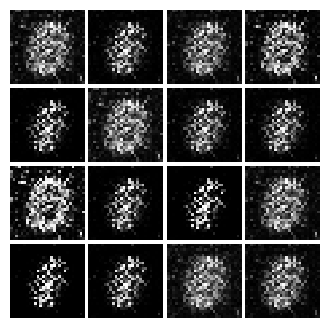

Epoch: 1, Iter: 480, D: 0.1026, G:0.3396


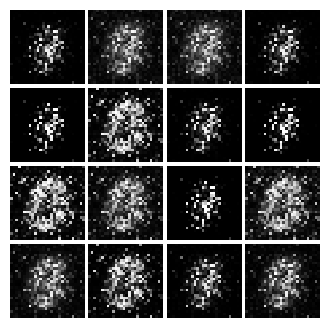

Epoch: 1, Iter: 500, D: 0.1146, G:0.5364


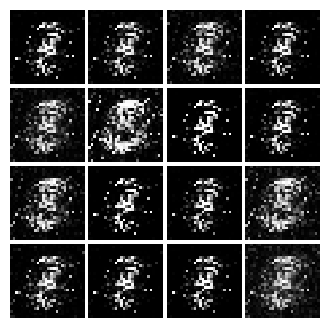

Epoch: 1, Iter: 520, D: 0.08975, G:0.5324


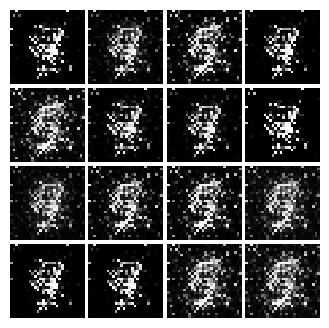

Epoch: 1, Iter: 540, D: 0.1185, G:0.4333


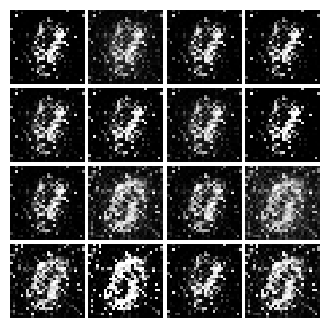

Epoch: 1, Iter: 560, D: 0.133, G:0.3732


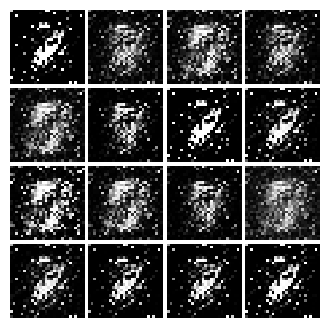

Epoch: 1, Iter: 580, D: 0.1168, G:0.3818


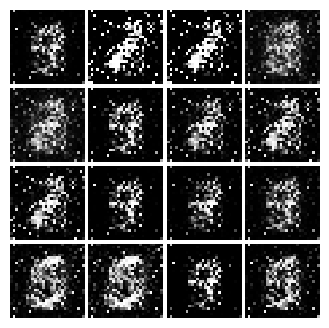

Epoch: 1, Iter: 600, D: 0.0855, G:0.4533


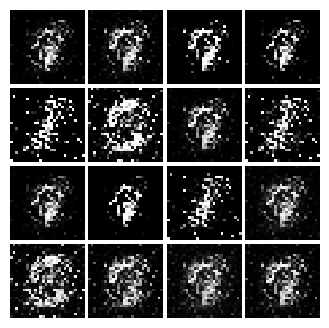

Epoch: 1, Iter: 620, D: 0.1201, G:0.4318


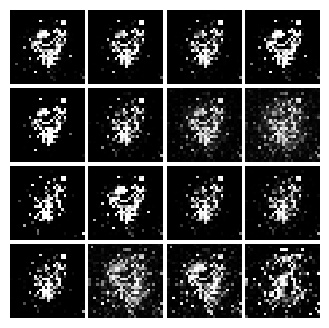

Epoch: 1, Iter: 640, D: 0.1719, G:0.38


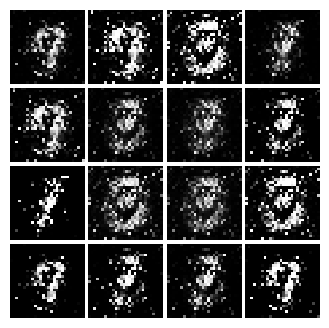

Epoch: 1, Iter: 660, D: 0.2022, G:0.3461


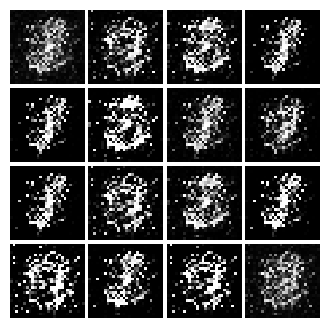

Epoch: 1, Iter: 680, D: 0.1426, G:0.3125


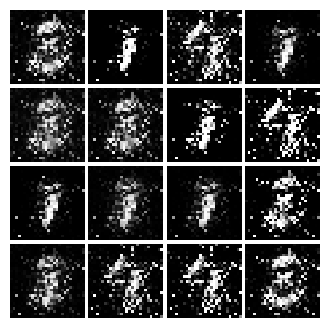

Epoch: 1, Iter: 700, D: 0.1241, G:0.3972


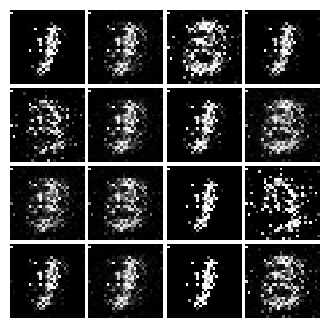

Epoch: 1, Iter: 720, D: 0.118, G:0.4911


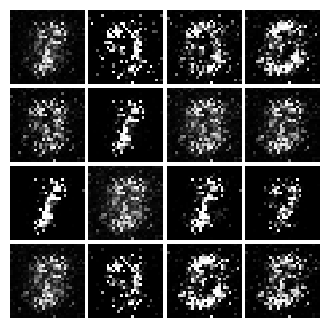

Epoch: 1, Iter: 740, D: 0.08884, G:0.4179


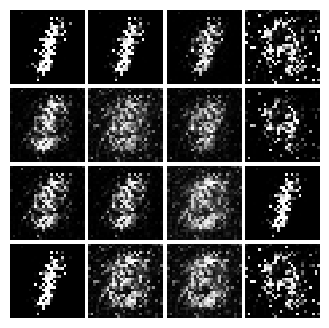

Epoch: 1, Iter: 760, D: 0.158, G:0.2957


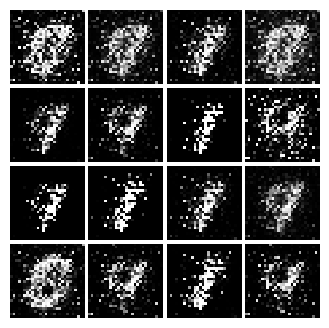

Epoch: 1, Iter: 780, D: 0.1775, G:0.2652


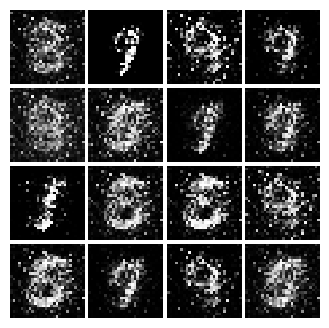

Epoch: 1, Iter: 800, D: 0.1717, G:0.3688


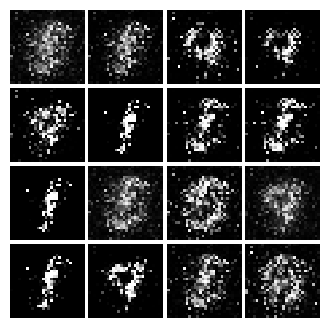

Epoch: 1, Iter: 820, D: 0.1873, G:0.2367


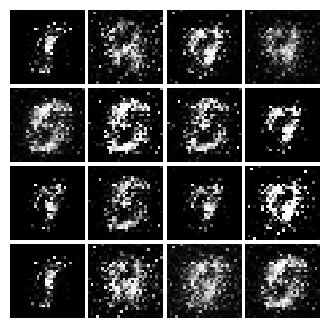

Epoch: 1, Iter: 840, D: 0.1615, G:0.3398


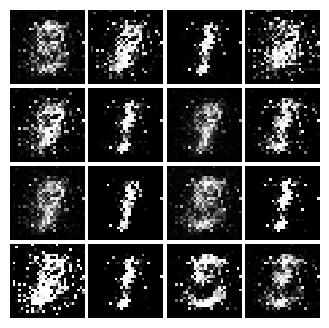

Epoch: 1, Iter: 860, D: 0.1319, G:0.2313


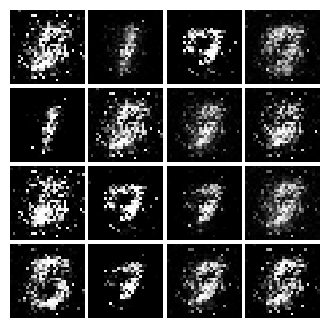

Epoch: 1, Iter: 880, D: 0.1209, G:0.1298


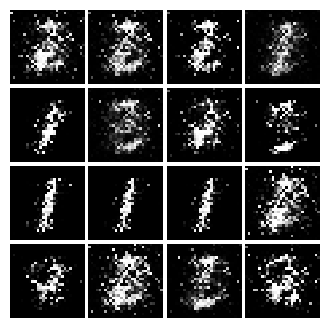

Epoch: 1, Iter: 900, D: 0.2014, G:0.3593


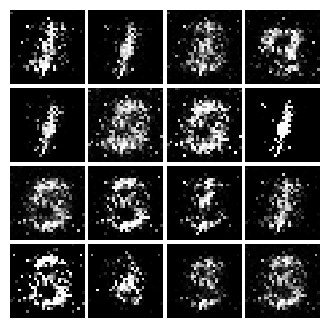

Epoch: 1, Iter: 920, D: 0.1798, G:0.2205


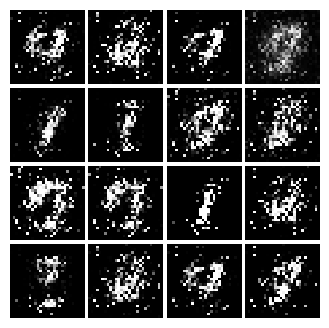

Epoch: 2, Iter: 940, D: 0.2167, G:0.3117


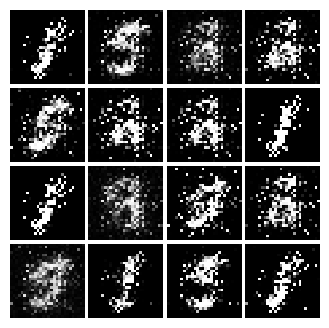

Epoch: 2, Iter: 960, D: 0.1646, G:0.2882


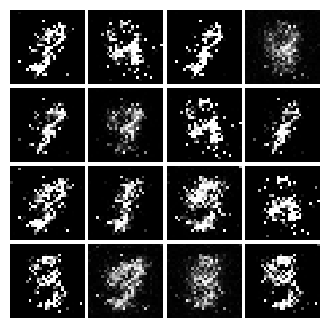

Epoch: 2, Iter: 980, D: 0.1366, G:0.2822


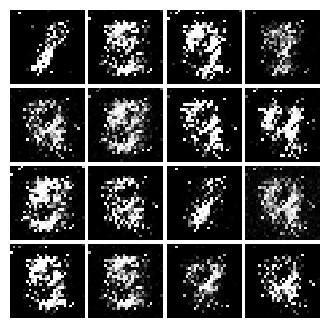

Epoch: 2, Iter: 1000, D: 0.1273, G:0.4432


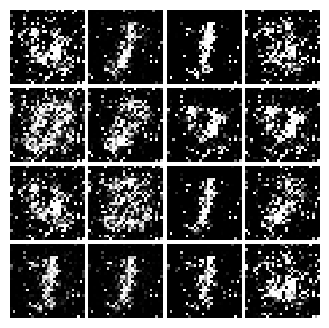

Epoch: 2, Iter: 1020, D: 0.195, G:0.3305


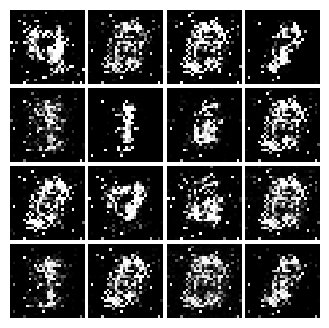

Epoch: 2, Iter: 1040, D: 0.233, G:0.04736


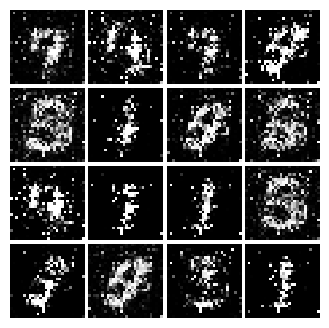

Epoch: 2, Iter: 1060, D: 0.1831, G:0.2818


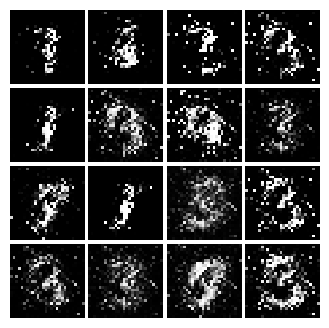

Epoch: 2, Iter: 1080, D: 0.1536, G:0.3894


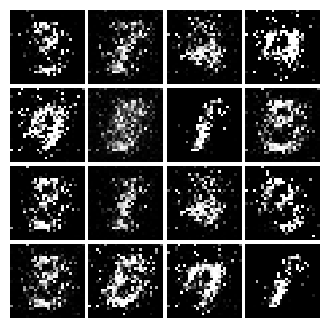

Epoch: 2, Iter: 1100, D: 0.1463, G:0.2971


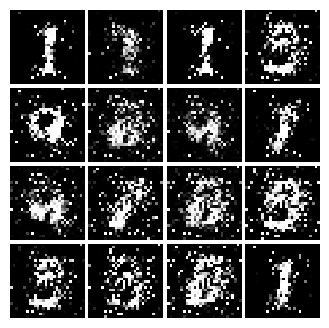

Epoch: 2, Iter: 1120, D: 0.1843, G:0.356


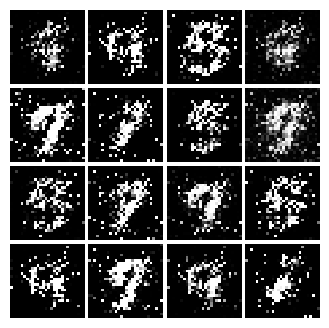

Epoch: 2, Iter: 1140, D: 0.1957, G:0.1938


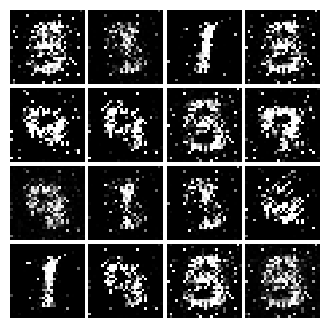

Epoch: 2, Iter: 1160, D: 0.1403, G:0.3407


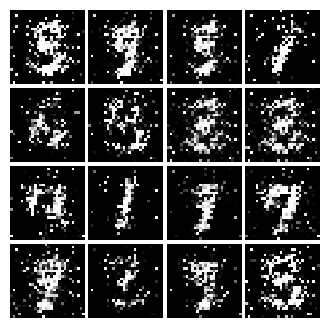

Epoch: 2, Iter: 1180, D: 0.3172, G:0.6606


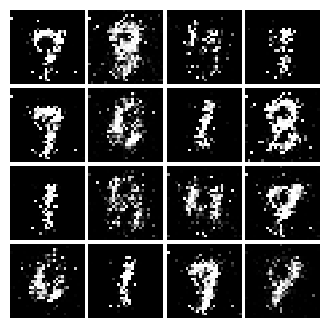

Epoch: 2, Iter: 1200, D: 0.14, G:0.2951


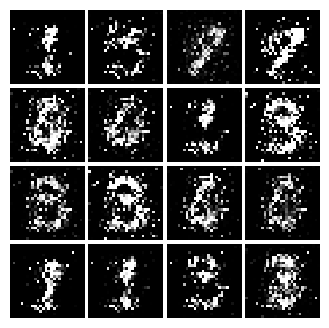

Epoch: 2, Iter: 1220, D: 0.1469, G:0.3702


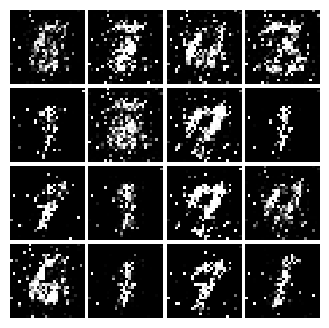

Epoch: 2, Iter: 1240, D: 0.1408, G:0.3251


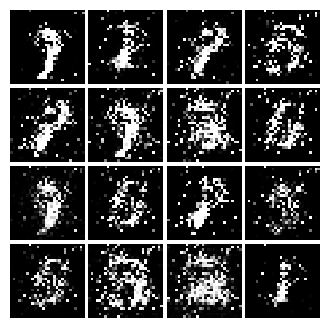

Epoch: 2, Iter: 1260, D: 0.2018, G:0.1802


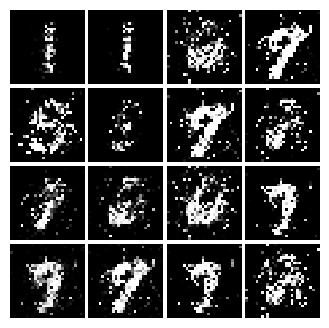

Epoch: 2, Iter: 1280, D: 0.1958, G:0.388


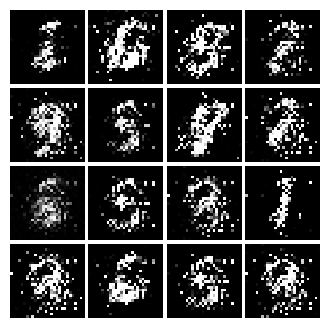

Epoch: 2, Iter: 1300, D: 0.167, G:0.1996


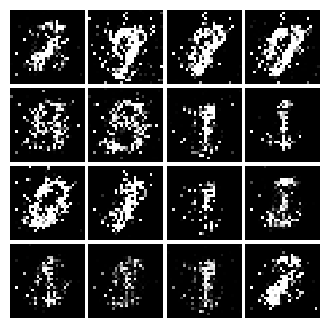

Epoch: 2, Iter: 1320, D: 0.1738, G:0.1621


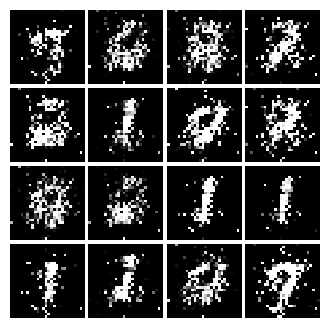

Epoch: 2, Iter: 1340, D: 0.1535, G:0.2219


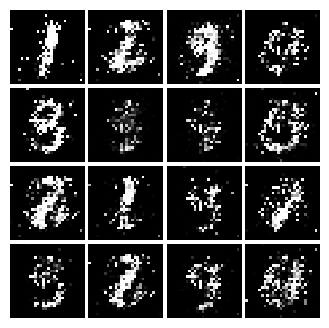

Epoch: 2, Iter: 1360, D: 0.1465, G:0.2732


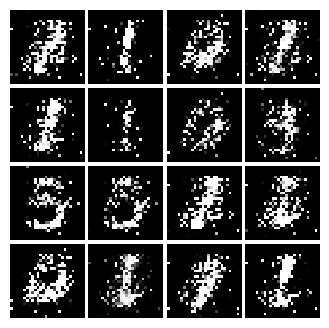

Epoch: 2, Iter: 1380, D: 0.1913, G:0.2579


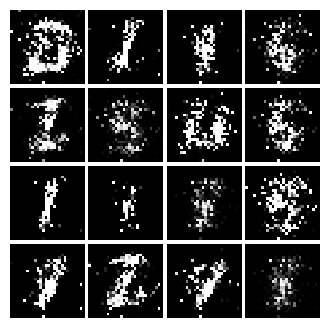

Epoch: 2, Iter: 1400, D: 0.1665, G:0.2818


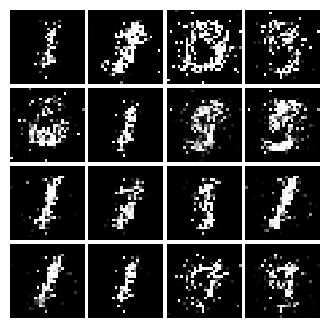

Epoch: 3, Iter: 1420, D: 0.1451, G:0.2273


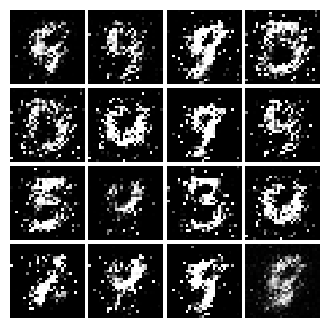

Epoch: 3, Iter: 1440, D: 0.1456, G:0.2676


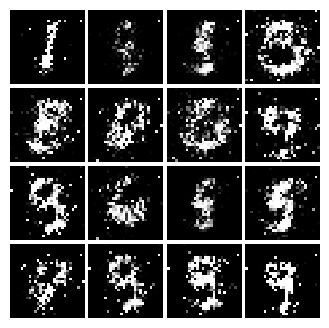

Epoch: 3, Iter: 1460, D: 0.2347, G:0.2116


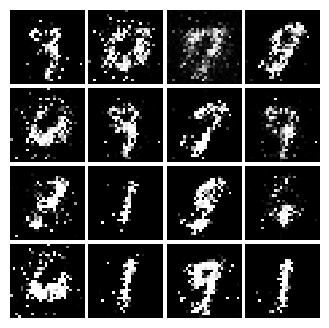

Epoch: 3, Iter: 1480, D: 0.1669, G:0.2714


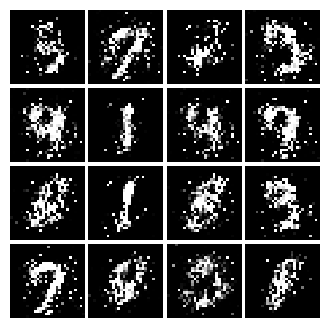

Epoch: 3, Iter: 1500, D: 0.1599, G:0.3277


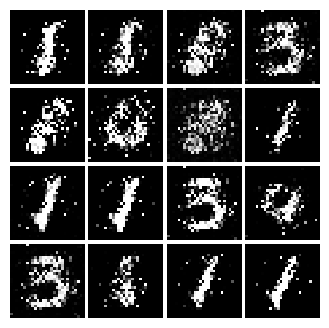

Epoch: 3, Iter: 1520, D: 0.2206, G:0.2304


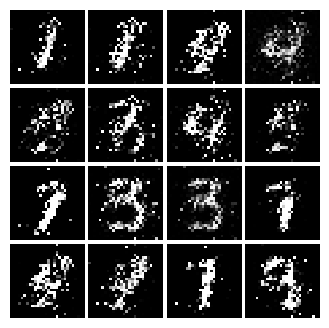

Epoch: 3, Iter: 1540, D: 0.1667, G:0.4185


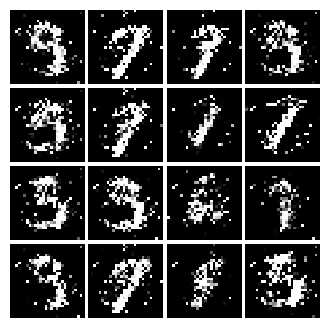

Epoch: 3, Iter: 1560, D: 0.1685, G:0.2332


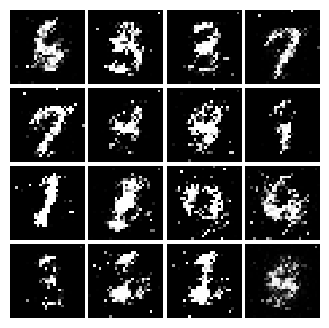

Epoch: 3, Iter: 1580, D: 0.1802, G:0.3142


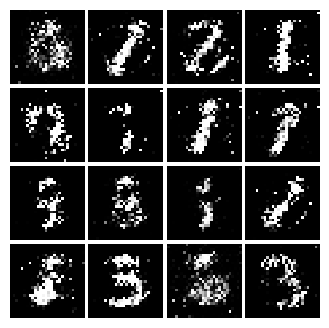

Epoch: 3, Iter: 1600, D: 0.2249, G:0.2257


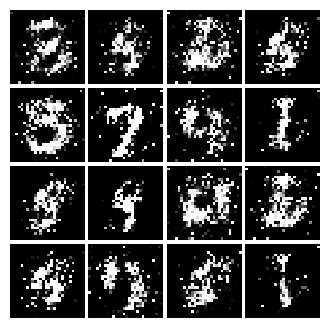

Epoch: 3, Iter: 1620, D: 0.1787, G:0.2791


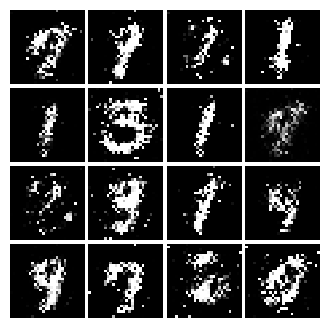

Epoch: 3, Iter: 1640, D: 0.1814, G:0.1843


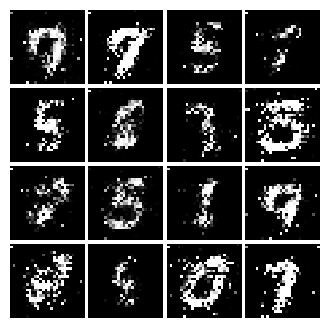

Epoch: 3, Iter: 1660, D: 0.1649, G:0.3238


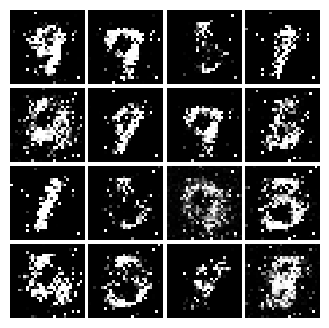

Epoch: 3, Iter: 1680, D: 0.1845, G:0.2867


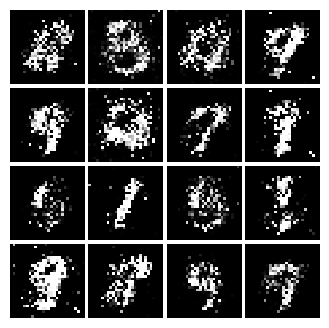

Epoch: 3, Iter: 1700, D: 0.1951, G:0.2389


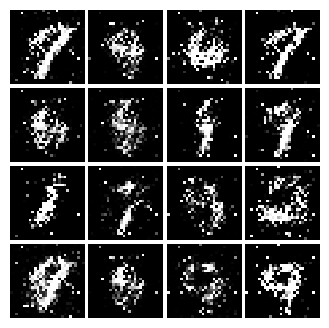

Epoch: 3, Iter: 1720, D: 0.2139, G:0.2435


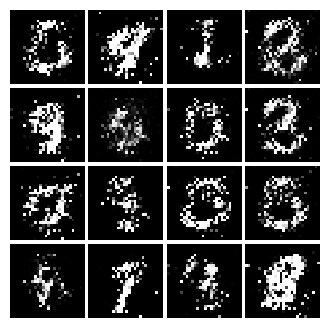

Epoch: 3, Iter: 1740, D: 0.1691, G:0.236


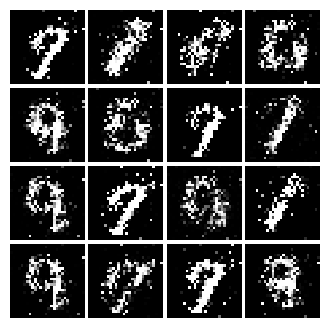

Epoch: 3, Iter: 1760, D: 0.1798, G:0.4334


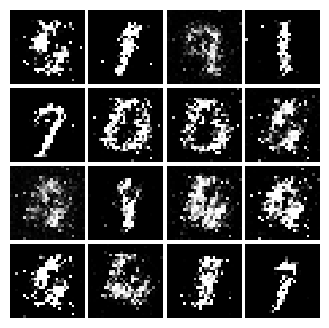

Epoch: 3, Iter: 1780, D: 0.168, G:0.2209


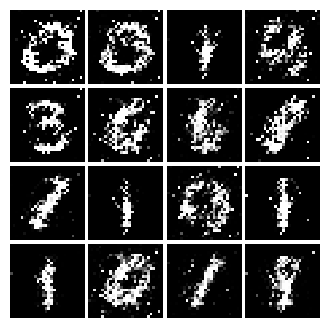

Epoch: 3, Iter: 1800, D: 0.203, G:0.2064


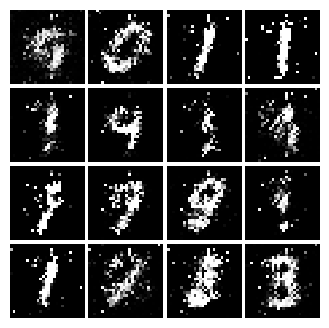

Epoch: 3, Iter: 1820, D: 0.1827, G:0.2298


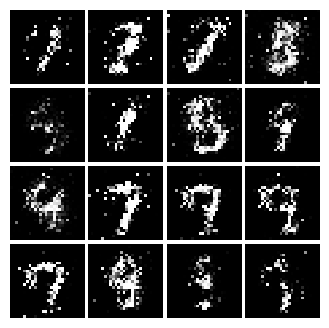

Epoch: 3, Iter: 1840, D: 0.2065, G:0.2049


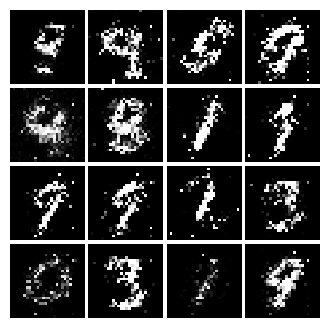

Epoch: 3, Iter: 1860, D: 0.1711, G:0.2314


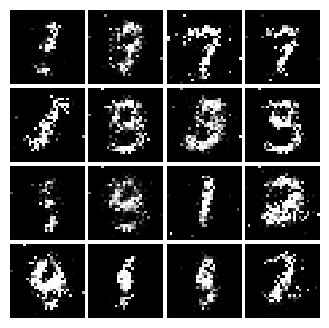

Epoch: 4, Iter: 1880, D: 0.1971, G:0.2418


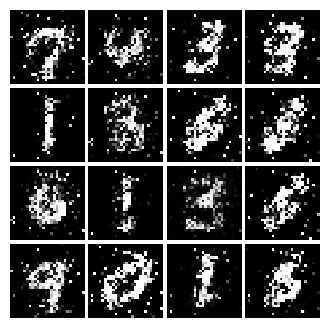

Epoch: 4, Iter: 1900, D: 0.1899, G:0.1825


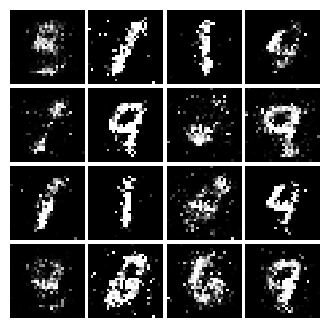

Epoch: 4, Iter: 1920, D: 0.1879, G:0.251


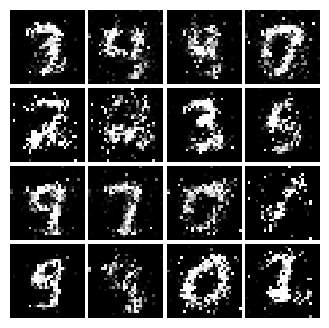

Epoch: 4, Iter: 1940, D: 0.2294, G:0.2221


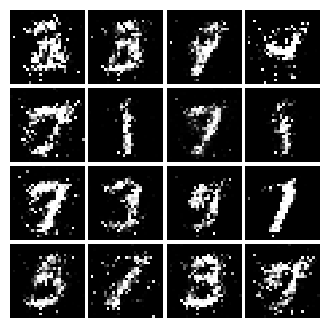

Epoch: 4, Iter: 1960, D: 0.2195, G:0.1229


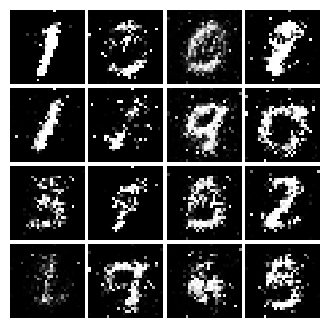

Epoch: 4, Iter: 1980, D: 0.2028, G:0.2176


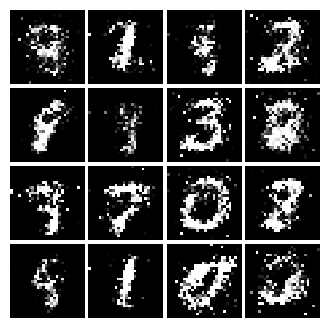

Epoch: 4, Iter: 2000, D: 0.231, G:0.2013


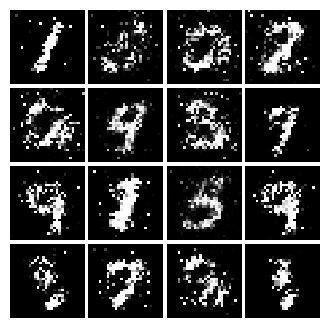

Epoch: 4, Iter: 2020, D: 0.2546, G:0.2004


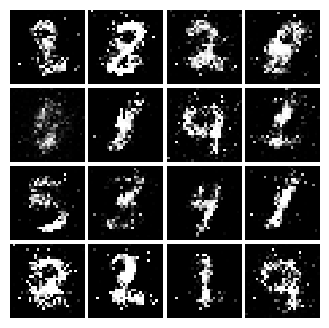

Epoch: 4, Iter: 2040, D: 0.2404, G:0.2147


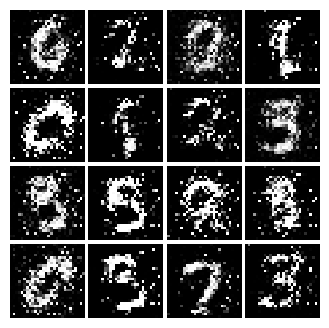

Epoch: 4, Iter: 2060, D: 0.4106, G:0.03652


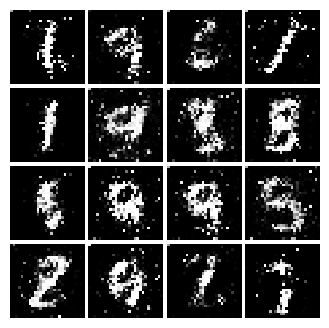

Epoch: 4, Iter: 2080, D: 0.206, G:0.2241


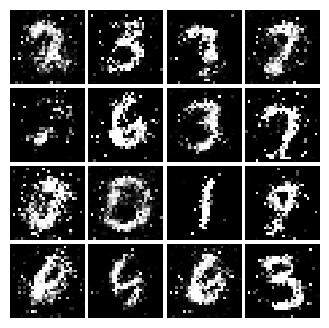

Epoch: 4, Iter: 2100, D: 0.2172, G:0.1481


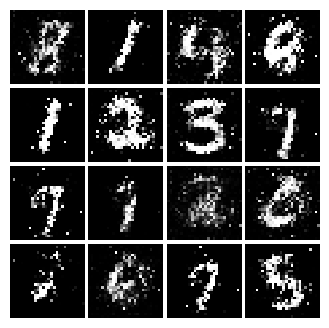

Epoch: 4, Iter: 2120, D: 0.2363, G:0.1864


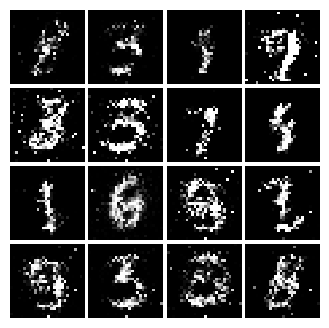

Epoch: 4, Iter: 2140, D: 0.1864, G:0.245


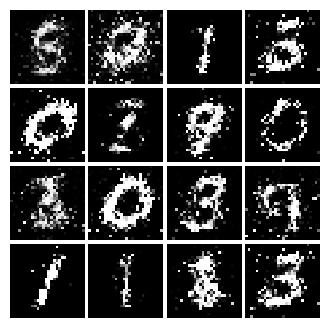

Epoch: 4, Iter: 2160, D: 0.2328, G:0.2102


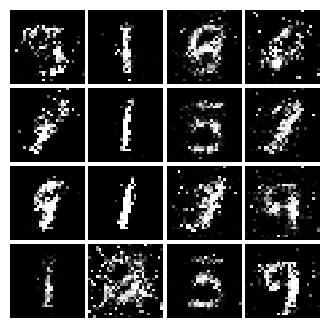

Epoch: 4, Iter: 2180, D: 0.213, G:0.16


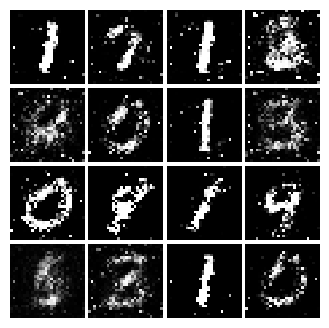

Epoch: 4, Iter: 2200, D: 0.1931, G:0.2558


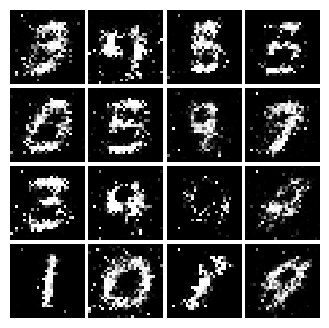

Epoch: 4, Iter: 2220, D: 0.2214, G:0.1682


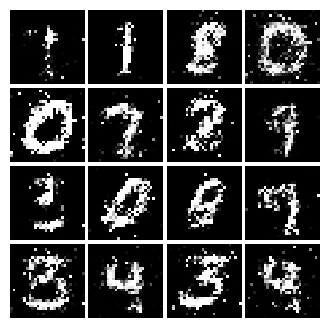

Epoch: 4, Iter: 2240, D: 0.222, G:0.1792


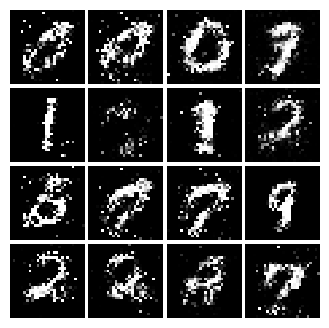

Epoch: 4, Iter: 2260, D: 0.2268, G:0.2025


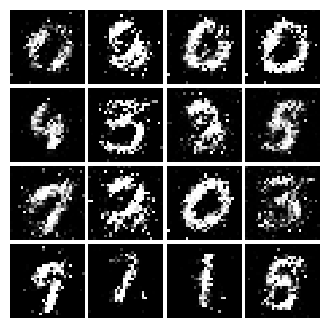

Epoch: 4, Iter: 2280, D: 0.2326, G:0.1851


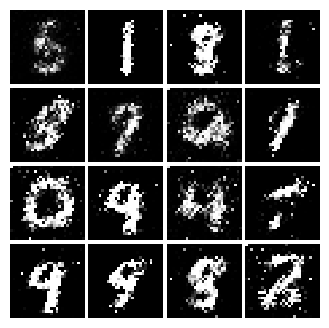

Epoch: 4, Iter: 2300, D: 0.2134, G:0.1657


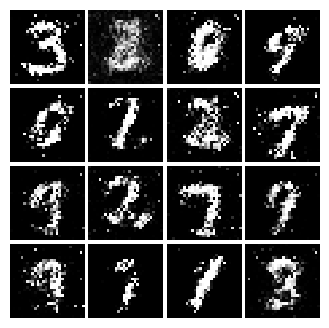

Epoch: 4, Iter: 2320, D: 0.1976, G:0.1771


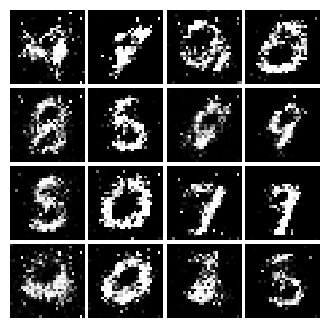

Epoch: 4, Iter: 2340, D: 0.1657, G:0.2781


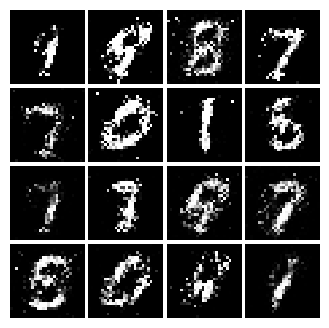

Epoch: 5, Iter: 2360, D: 0.2059, G:0.1586


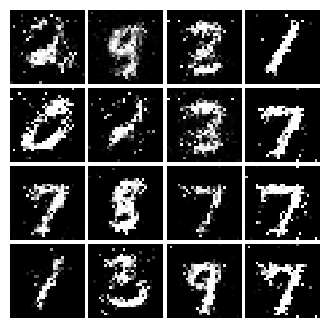

Epoch: 5, Iter: 2380, D: 0.2209, G:0.1848


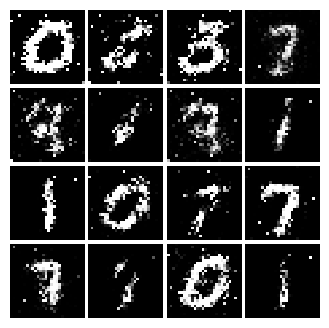

Epoch: 5, Iter: 2400, D: 0.2411, G:0.2225


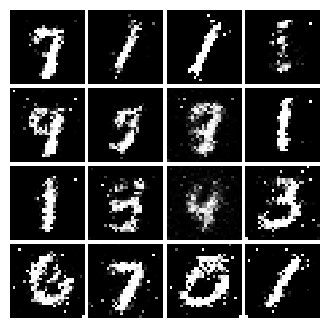

Epoch: 5, Iter: 2420, D: 0.2026, G:0.2488


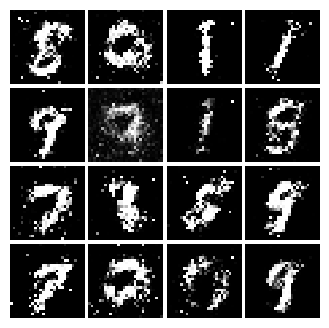

Epoch: 5, Iter: 2440, D: 0.2154, G:0.1817


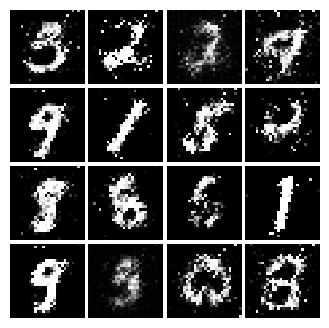

Epoch: 5, Iter: 2460, D: 0.1957, G:0.2164


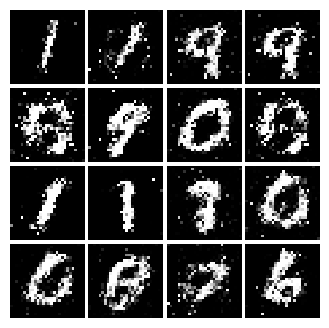

Epoch: 5, Iter: 2480, D: 0.2232, G:0.1819


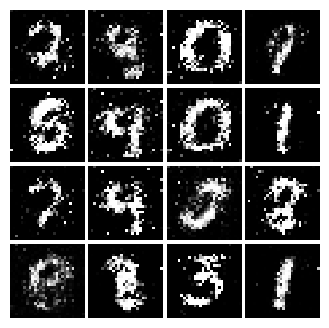

Epoch: 5, Iter: 2500, D: 0.2043, G:0.1878


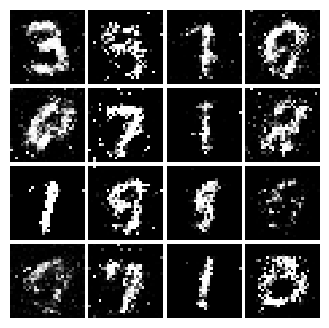

Epoch: 5, Iter: 2520, D: 0.2379, G:0.1604


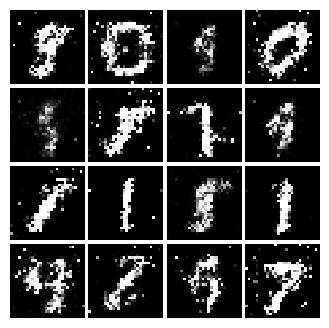

Epoch: 5, Iter: 2540, D: 0.2231, G:0.2002


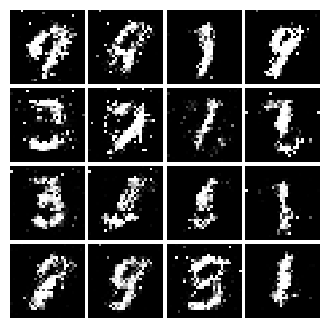

Epoch: 5, Iter: 2560, D: 0.2271, G:0.1967


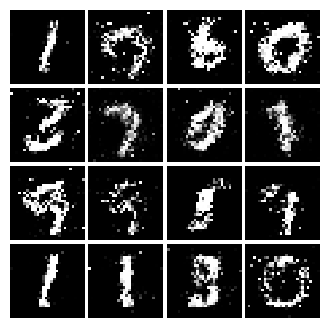

Epoch: 5, Iter: 2580, D: 0.2238, G:0.1718


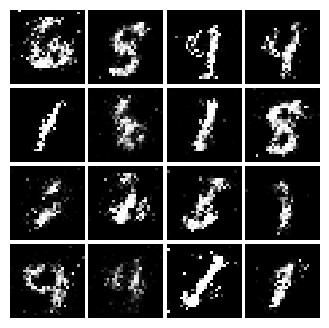

Epoch: 5, Iter: 2600, D: 0.273, G:0.1826


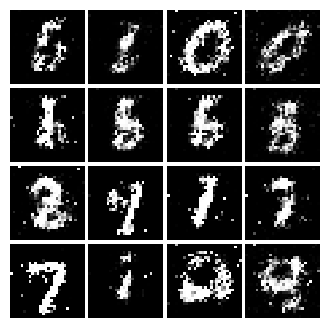

Epoch: 5, Iter: 2620, D: 0.2003, G:0.2064


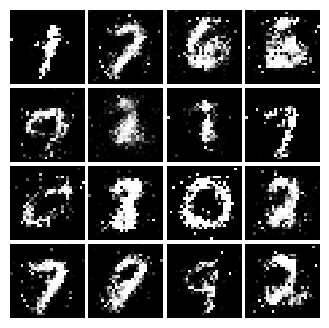

Epoch: 5, Iter: 2640, D: 0.2079, G:0.2066


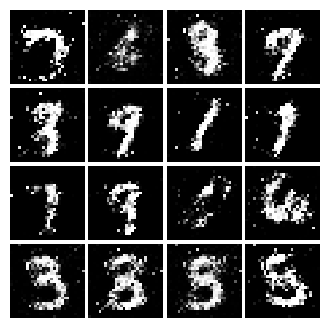

Epoch: 5, Iter: 2660, D: 0.1987, G:0.1808


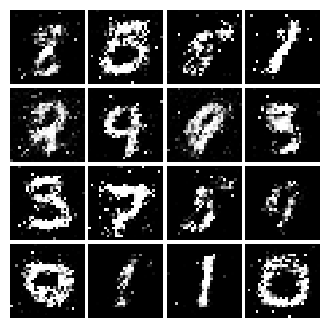

Epoch: 5, Iter: 2680, D: 0.2534, G:0.1858


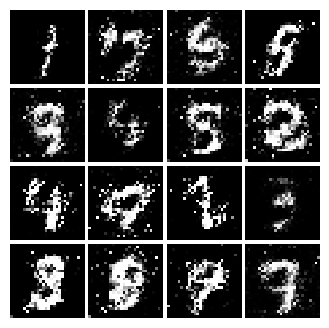

Epoch: 5, Iter: 2700, D: 0.2291, G:0.1711


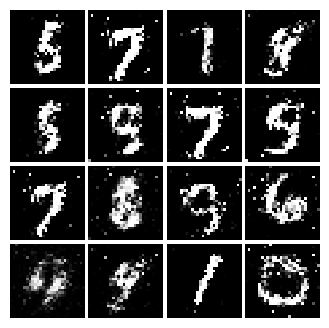

Epoch: 5, Iter: 2720, D: 0.2146, G:0.2416


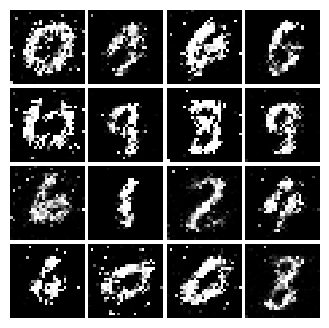

Epoch: 5, Iter: 2740, D: 0.2371, G:0.1859


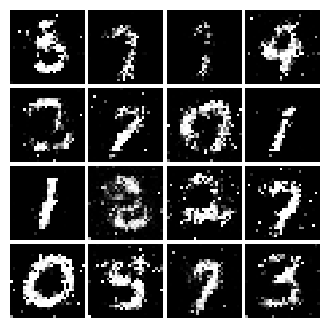

Epoch: 5, Iter: 2760, D: 0.2265, G:0.2172


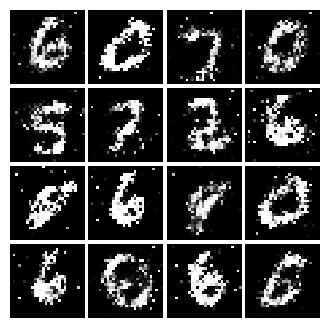

Epoch: 5, Iter: 2780, D: 0.2137, G:0.1671


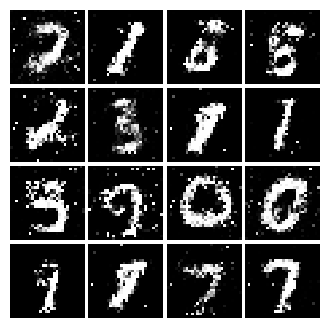

Epoch: 5, Iter: 2800, D: 0.2015, G:0.1832


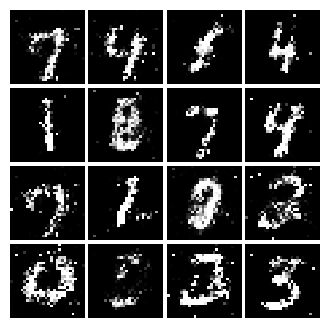

Epoch: 6, Iter: 2820, D: 0.2189, G:0.1667


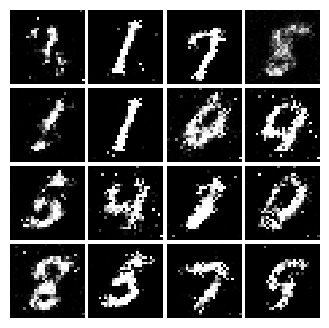

Epoch: 6, Iter: 2840, D: 0.2308, G:0.1537


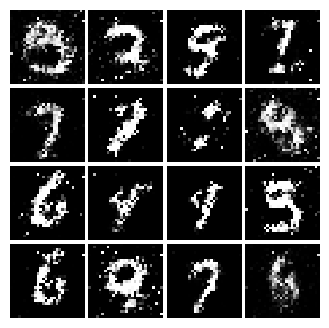

Epoch: 6, Iter: 2860, D: 0.1954, G:0.2141


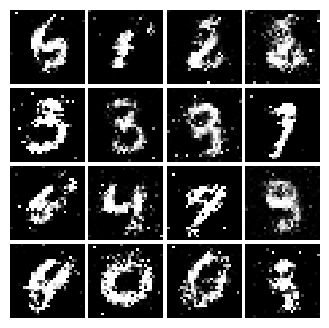

Epoch: 6, Iter: 2880, D: 0.2002, G:0.2064


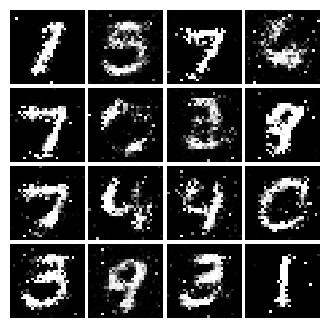

Epoch: 6, Iter: 2900, D: 0.215, G:0.1957


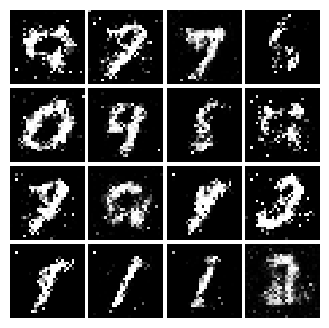

Epoch: 6, Iter: 2920, D: 0.2512, G:0.1772


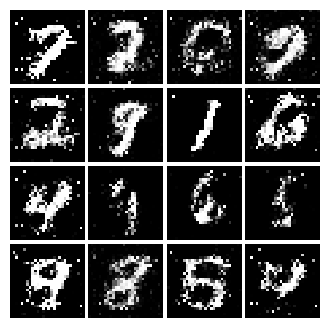

Epoch: 6, Iter: 2940, D: 0.2152, G:0.154


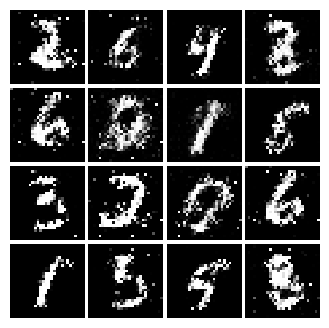

Epoch: 6, Iter: 2960, D: 0.2179, G:0.1889


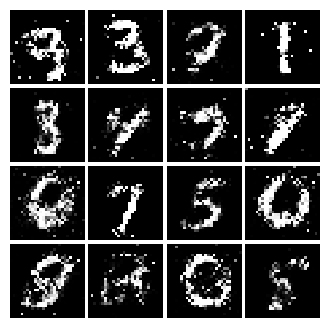

Epoch: 6, Iter: 2980, D: 0.2292, G:0.158


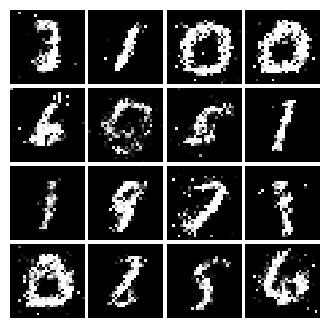

Epoch: 6, Iter: 3000, D: 0.2271, G:0.1641


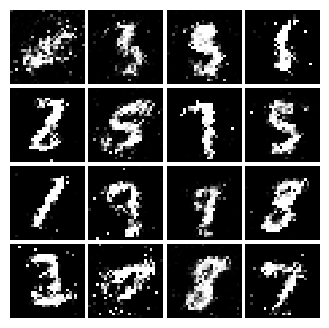

Epoch: 6, Iter: 3020, D: 0.2218, G:0.1808


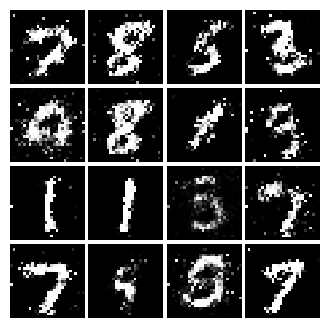

Epoch: 6, Iter: 3040, D: 0.2134, G:0.1867


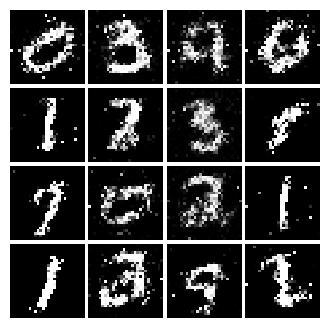

Epoch: 6, Iter: 3060, D: 0.2476, G:0.163


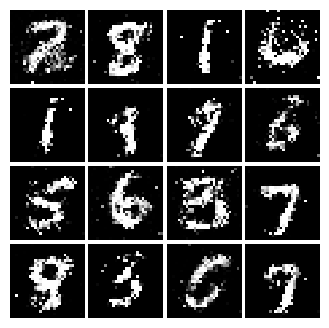

Epoch: 6, Iter: 3080, D: 0.2102, G:0.1978


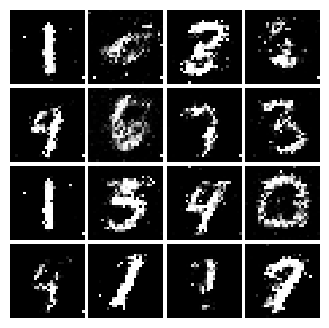

Epoch: 6, Iter: 3100, D: 0.2153, G:0.1797


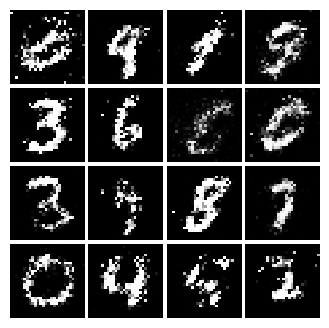

Epoch: 6, Iter: 3120, D: 0.2069, G:0.1558


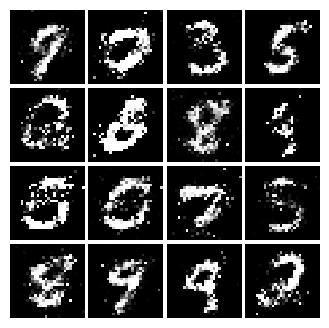

Epoch: 6, Iter: 3140, D: 0.2525, G:0.1568


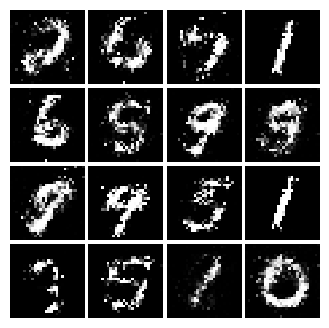

Epoch: 6, Iter: 3160, D: 0.2179, G:0.1563


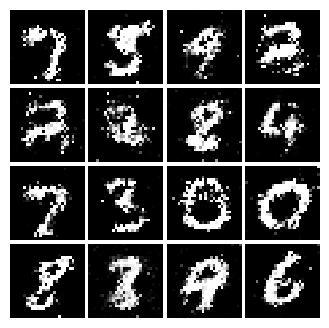

Epoch: 6, Iter: 3180, D: 0.2033, G:0.1773


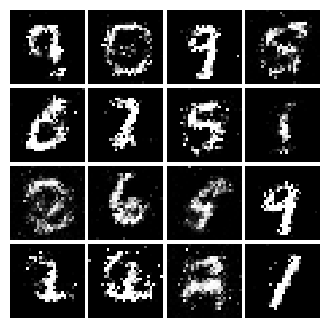

Epoch: 6, Iter: 3200, D: 0.2163, G:0.1643


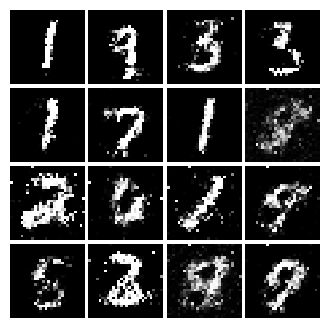

Epoch: 6, Iter: 3220, D: 0.221, G:0.1883


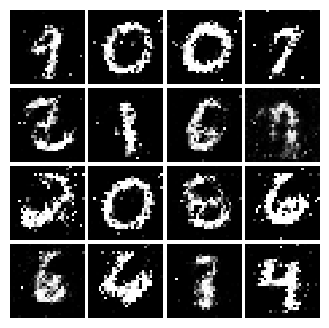

Epoch: 6, Iter: 3240, D: 0.2172, G:0.1539


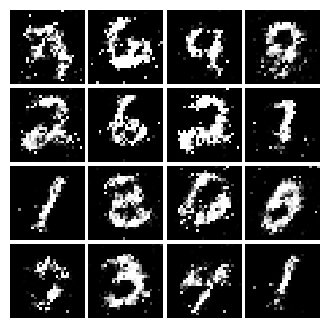

Epoch: 6, Iter: 3260, D: 0.2339, G:0.1546


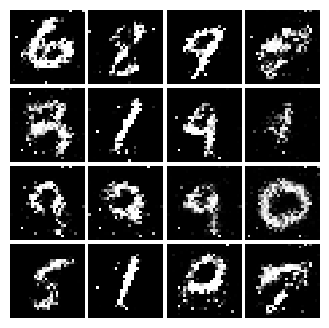

Epoch: 6, Iter: 3280, D: 0.2165, G:0.1432


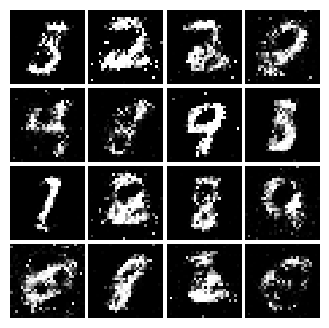

Epoch: 7, Iter: 3300, D: 0.2006, G:0.1561


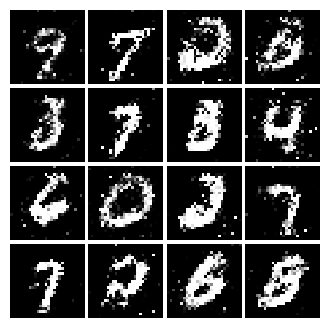

Epoch: 7, Iter: 3320, D: 0.2191, G:0.1621


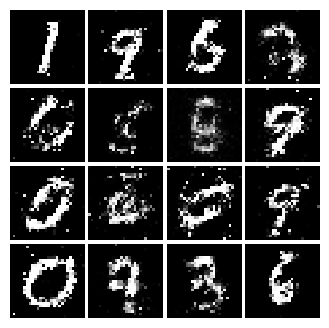

Epoch: 7, Iter: 3340, D: 0.2405, G:0.1706


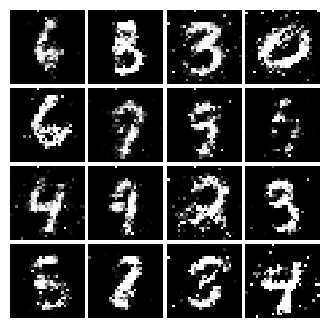

Epoch: 7, Iter: 3360, D: 0.2509, G:0.1765


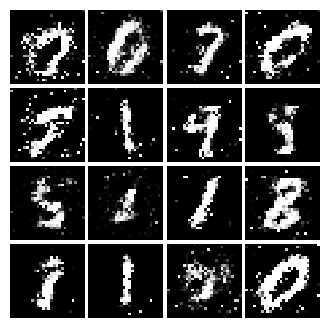

Epoch: 7, Iter: 3380, D: 0.2199, G:0.1719


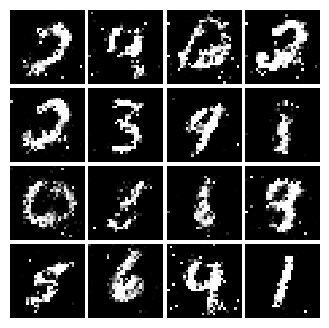

Epoch: 7, Iter: 3400, D: 0.2422, G:0.1521


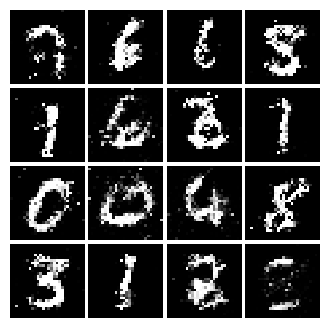

Epoch: 7, Iter: 3420, D: 0.2145, G:0.1996


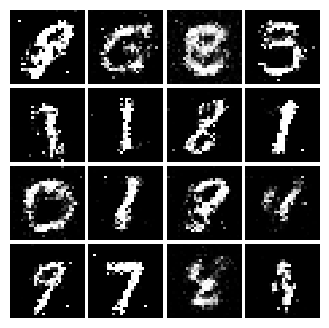

Epoch: 7, Iter: 3440, D: 0.215, G:0.193


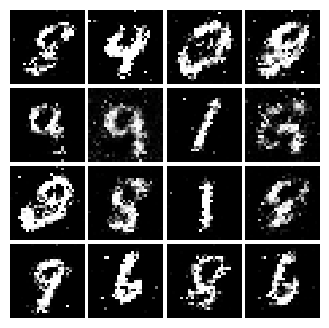

Epoch: 7, Iter: 3460, D: 0.212, G:0.2055


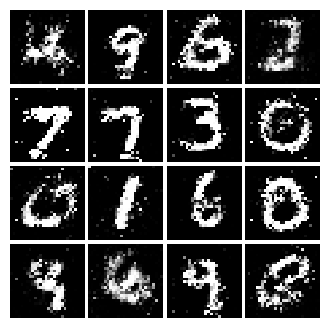

Epoch: 7, Iter: 3480, D: 0.2103, G:0.185


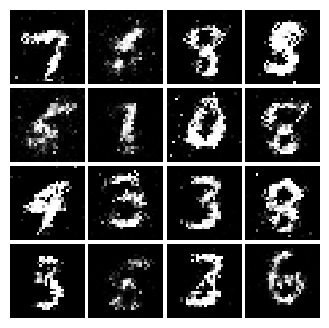

Epoch: 7, Iter: 3500, D: 0.2186, G:0.1732


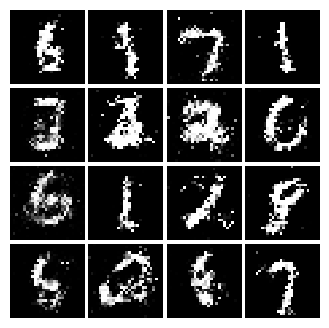

Epoch: 7, Iter: 3520, D: 0.2217, G:0.156


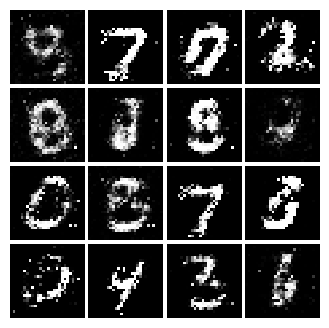

Epoch: 7, Iter: 3540, D: 0.1946, G:0.1989


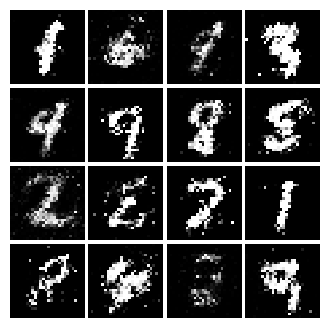

Epoch: 7, Iter: 3560, D: 0.2292, G:0.1902


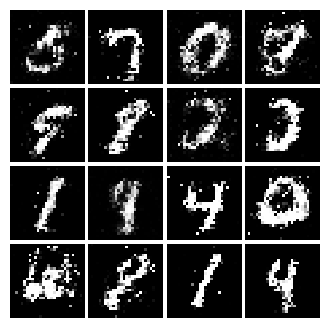

Epoch: 7, Iter: 3580, D: 0.2264, G:0.1592


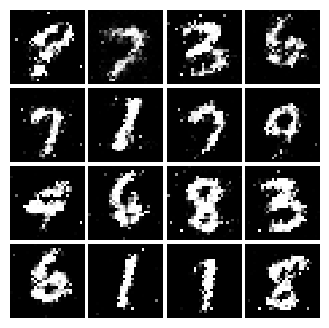

Epoch: 7, Iter: 3600, D: 0.2278, G:0.1612


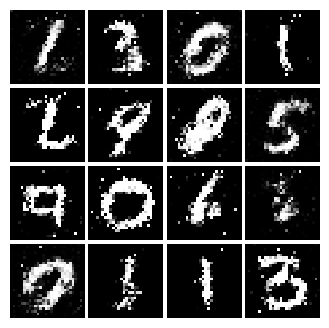

Epoch: 7, Iter: 3620, D: 0.2198, G:0.1771


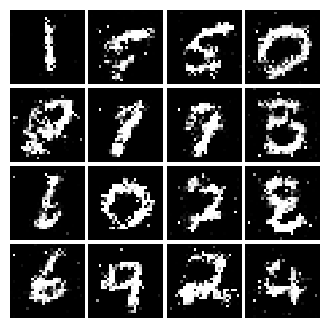

Epoch: 7, Iter: 3640, D: 0.2309, G:0.1649


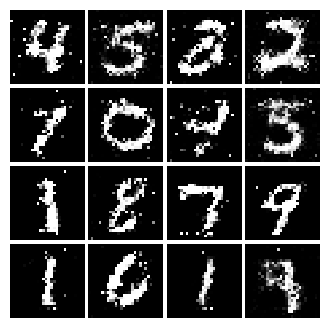

Epoch: 7, Iter: 3660, D: 0.2182, G:0.1825


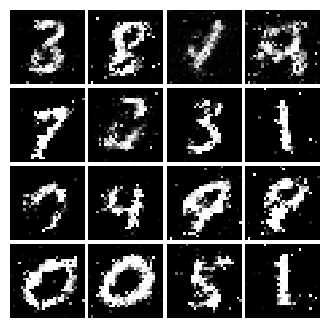

Epoch: 7, Iter: 3680, D: 0.2409, G:0.1914


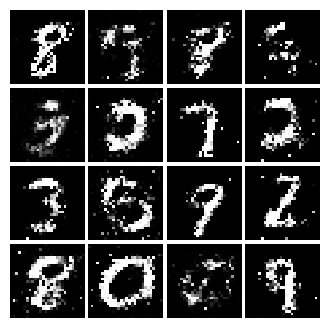

Epoch: 7, Iter: 3700, D: 0.2298, G:0.167


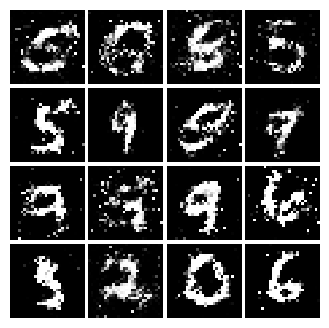

Epoch: 7, Iter: 3720, D: 0.2364, G:0.1578


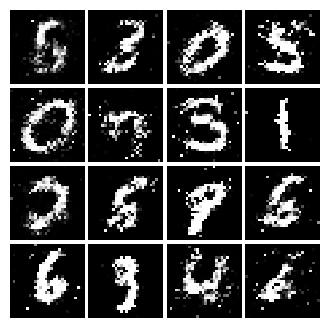

Epoch: 7, Iter: 3740, D: 0.2413, G:0.155


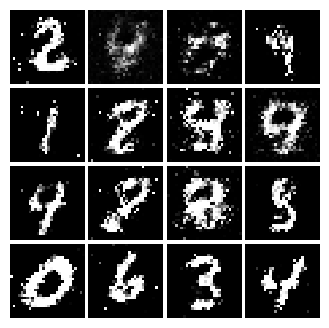

Epoch: 8, Iter: 3760, D: 0.2303, G:0.1844


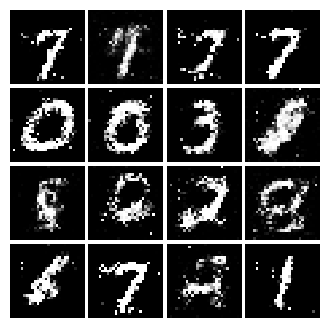

Epoch: 8, Iter: 3780, D: 0.2422, G:0.1419


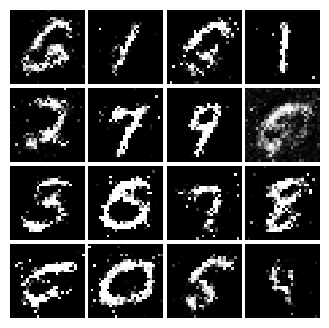

Epoch: 8, Iter: 3800, D: 0.2322, G:0.1722


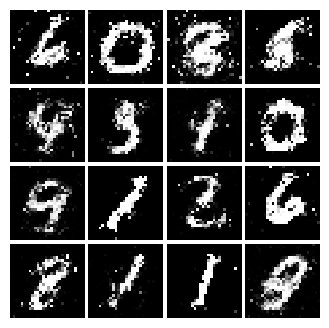

Epoch: 8, Iter: 3820, D: 0.2385, G:0.1865


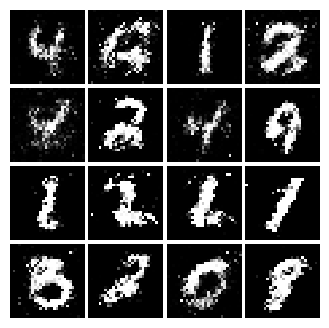

Epoch: 8, Iter: 3840, D: 0.2248, G:0.1639


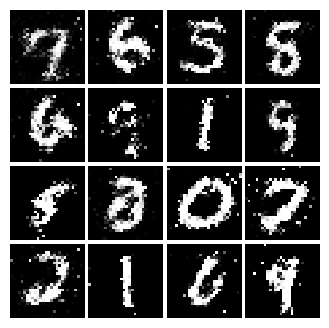

Epoch: 8, Iter: 3860, D: 0.2185, G:0.1644


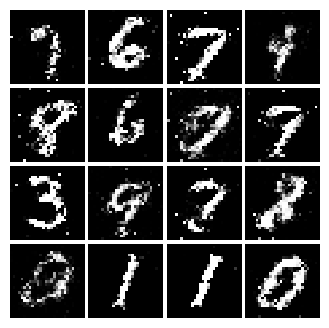

Epoch: 8, Iter: 3880, D: 0.2118, G:0.1728


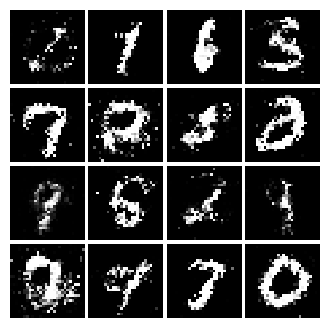

Epoch: 8, Iter: 3900, D: 0.2323, G:0.1558


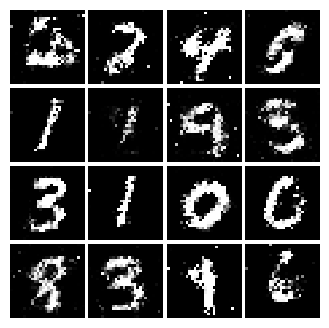

Epoch: 8, Iter: 3920, D: 0.2037, G:0.1927


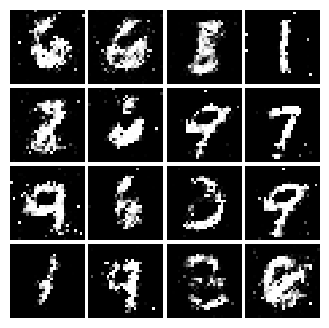

Epoch: 8, Iter: 3940, D: 0.2508, G:0.1761


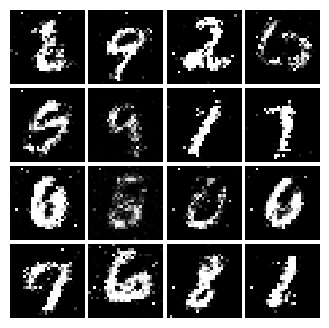

Epoch: 8, Iter: 3960, D: 0.2368, G:0.147


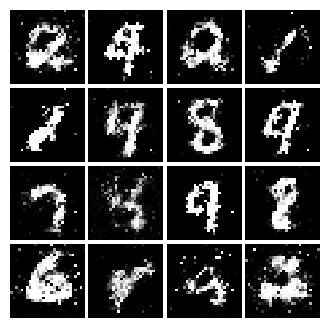

Epoch: 8, Iter: 3980, D: 0.2368, G:0.1637


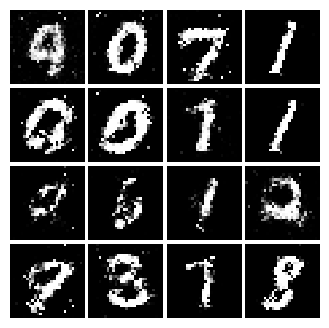

Epoch: 8, Iter: 4000, D: 0.2281, G:0.1736


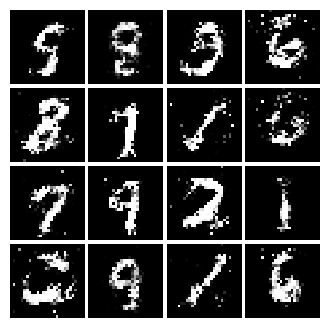

Epoch: 8, Iter: 4020, D: 0.2449, G:0.1675


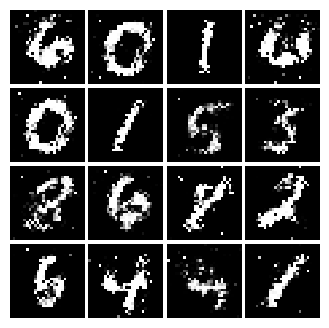

Epoch: 8, Iter: 4040, D: 0.2368, G:0.1732


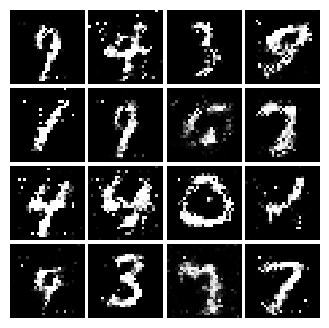

Epoch: 8, Iter: 4060, D: 0.2302, G:0.1521


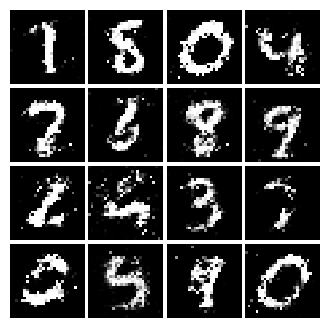

Epoch: 8, Iter: 4080, D: 0.251, G:0.1725


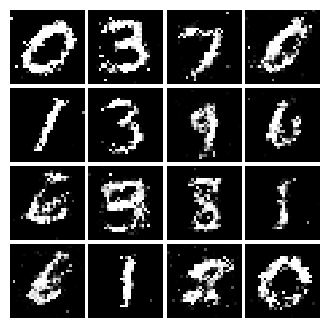

Epoch: 8, Iter: 4100, D: 0.2421, G:0.1574


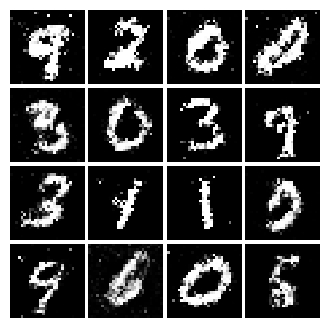

Epoch: 8, Iter: 4120, D: 0.2189, G:0.1366


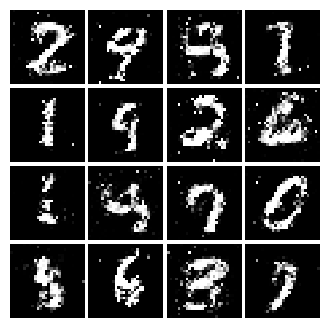

Epoch: 8, Iter: 4140, D: 0.2271, G:0.1908


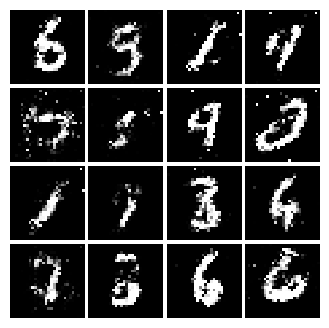

Epoch: 8, Iter: 4160, D: 0.241, G:0.1097


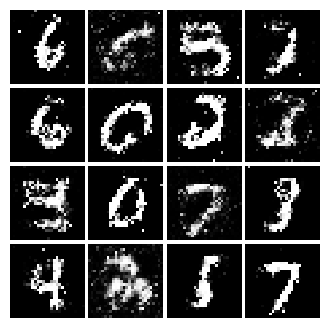

Epoch: 8, Iter: 4180, D: 0.2283, G:0.1661


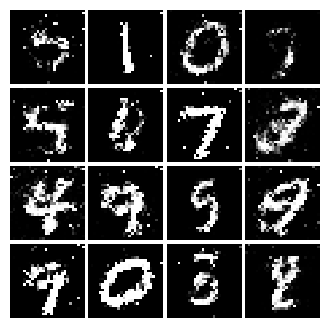

Epoch: 8, Iter: 4200, D: 0.2285, G:0.1572


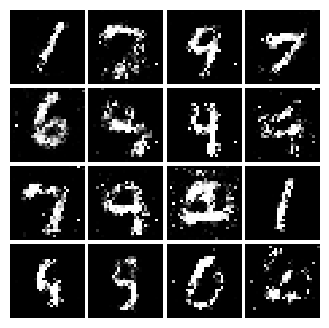

Epoch: 8, Iter: 4220, D: 0.2274, G:0.1738


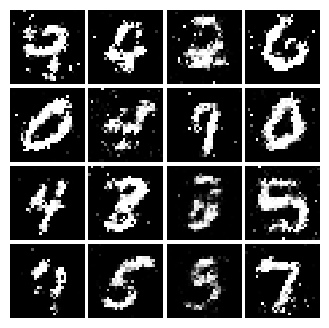

Epoch: 9, Iter: 4240, D: 0.241, G:0.1714


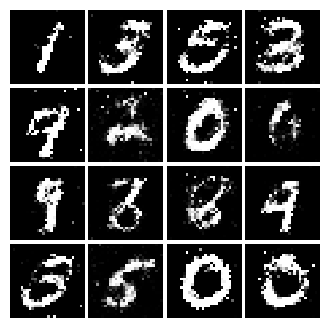

Epoch: 9, Iter: 4260, D: 0.2484, G:0.148


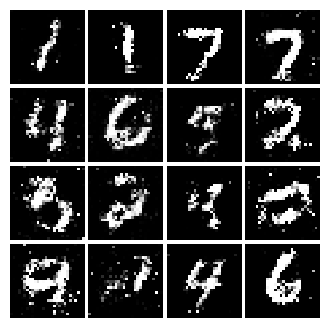

Epoch: 9, Iter: 4280, D: 0.2396, G:0.1798


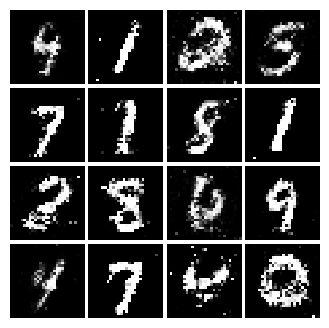

Epoch: 9, Iter: 4300, D: 0.2471, G:0.16


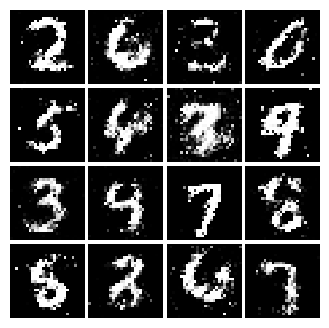

Epoch: 9, Iter: 4320, D: 0.2352, G:0.1632


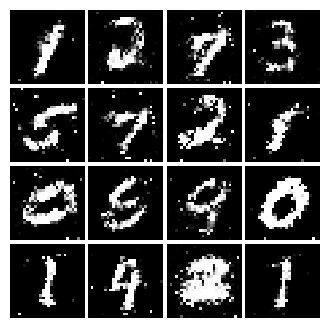

Epoch: 9, Iter: 4340, D: 0.2087, G:0.1717


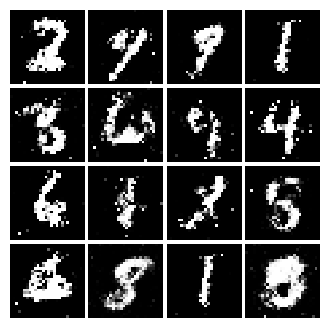

Epoch: 9, Iter: 4360, D: 0.231, G:0.1663


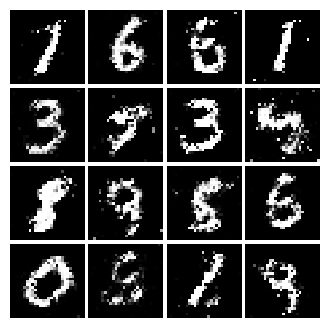

Epoch: 9, Iter: 4380, D: 0.2503, G:0.1557


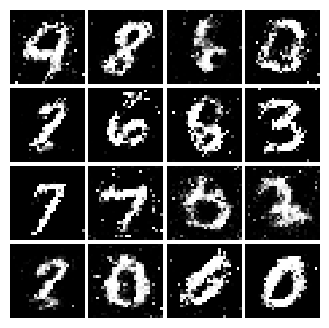

Epoch: 9, Iter: 4400, D: 0.2205, G:0.2087


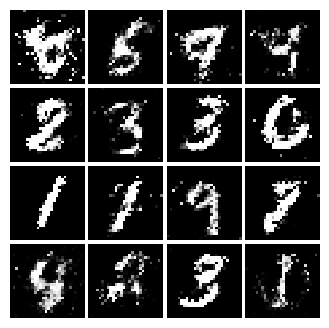

Epoch: 9, Iter: 4420, D: 0.2182, G:0.1736


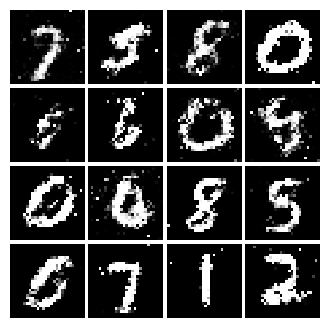

Epoch: 9, Iter: 4440, D: 0.2344, G:0.1452


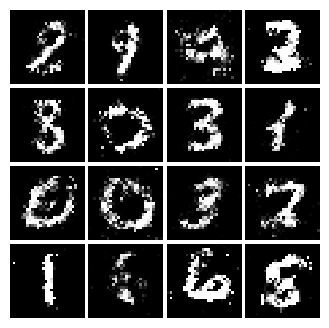

Epoch: 9, Iter: 4460, D: 0.2488, G:0.1672


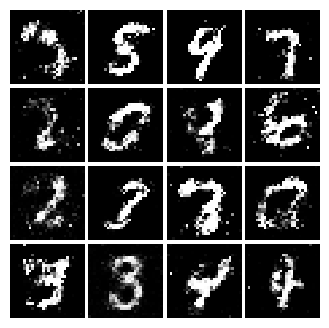

Epoch: 9, Iter: 4480, D: 0.2265, G:0.1696


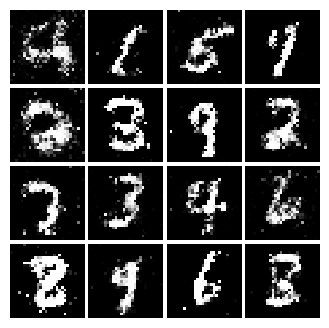

Epoch: 9, Iter: 4500, D: 0.243, G:0.1328


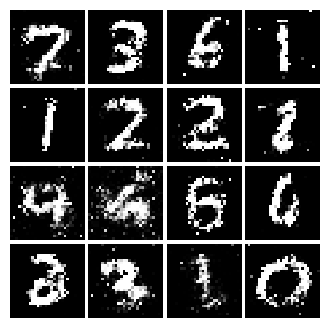

Epoch: 9, Iter: 4520, D: 0.2273, G:0.1356


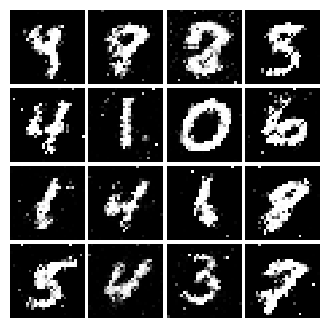

Epoch: 9, Iter: 4540, D: 0.2545, G:0.1431


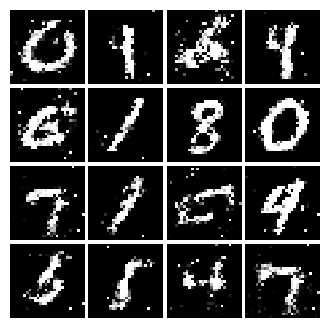

Epoch: 9, Iter: 4560, D: 0.2206, G:0.1533


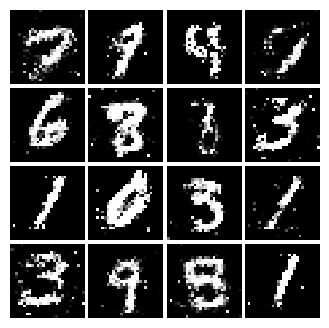

Epoch: 9, Iter: 4580, D: 0.2515, G:0.1701


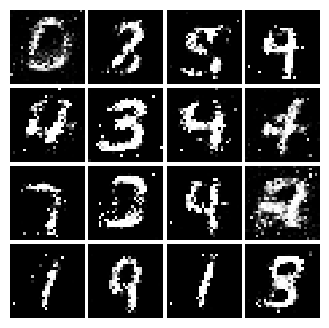

Epoch: 9, Iter: 4600, D: 0.2349, G:0.1434


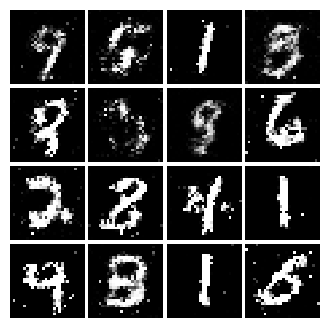

Epoch: 9, Iter: 4620, D: 0.2319, G:0.1753


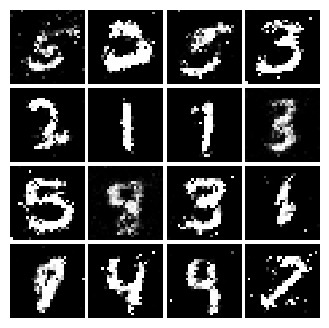

Epoch: 9, Iter: 4640, D: 0.2295, G:0.1581


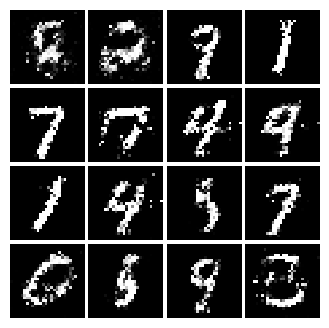

Epoch: 9, Iter: 4660, D: 0.231, G:0.1744


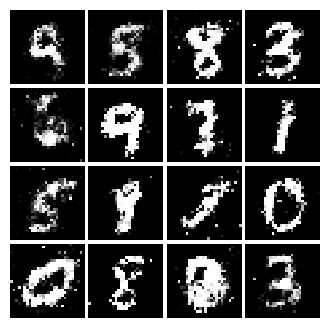

Epoch: 9, Iter: 4680, D: 0.2389, G:0.1702


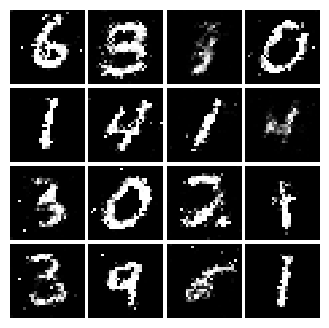

Final images


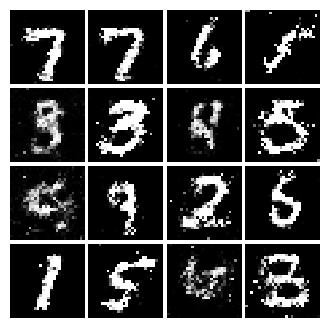

In [32]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, ls_generator_loss)

# Part II - Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [ ]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################

        # Conv2D: 32 Filters, 5x5, Stride 1, padding 0
        
        # Leaky ReLU(alpha=0.01)
        
        # Max Pool 2x2, Stride 2
        
        # Conv2D: 64 Filters, 5x5, Stride 1, padding 0
        
        # Leaky ReLU(alpha=0.01)
        
        # Max Pool 2x2, Stride 2
        
        # Flatten
        
        # Fully Connected with output size 4 x 4 x 64
        
        # Leaky ReLU(alpha=0.01)
        
        # Fully Connected with output size 1

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
    ])

    return model

model = discriminator()
test_discriminator(1102721)

#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [ ]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################
    
    # Fully connected with output size 1024
    
    # ReLU
    
    # BatchNorm
    
    # Fully connected with output size 7 x 7 x 128
    
    # ReLU
    
    # BatchNorm
    
    # Resize into Image Tensor of size 7, 7, 128
    
    # Conv2D^T (transpose): 64 filters of 4x4, stride 2
    
    # ReLU
    
    # BatchNorm
    
    # Conv2d^T (transpose): 1 filter of 4x4, stride 2
    
    # TanH

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

In [ ]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss, num_epochs=5)

# OPTIONAL: Part III - Sequence-to-Sequence Generative Model

Research and experiment on architecture and training of a sequence-to-sequence autoencoders and generative model for task such as language translation. Below are example tutorials:

- https://keras.io/examples/nlp/lstm_seq2seq/
- https://keras.io/examples/nlp/neural_machine_translation_with_transformer/